In [5]:
import numpy as np
import pandas as pd
from scipy import stats
import sys
import argparse
import h5py
from scipy.stats import t as student_t
from statsmodels.stats import multitest as mt
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

from scipy.stats import gaussian_kde, pearsonr

In [6]:
subjects_to_be_ignored = [21269692]
subject_sex = 'female'
prototype_flag = True

deconfound_flag = True
# if deconfound_flag == True:
#     import matlab.engine
#     eng = matlab.engine.start_matlab()
    
IDP_cuttoff_nan = 1.0
vars_cutoff_nan = 0.1

In [7]:
# # Identify Correct File to Load

# IDP_file = 'female_testB_IDPs.h5'
# confounds_file = 'female_testB_conf12.h5'
# data_file = 'female_testB.pkl'

# confounds = h5py.File(confounds_file, 'r')
# confounds = confounds['conf12'][()]

# IDP_h5 = h5py.File(IDP_file, 'r')
# subjects_h5 = IDP_h5['subjects'][()]

# # Load the relevant dataframe based on the required modality

# df = pd.read_pickle(data_file)

# IDP_h5 = h5py.File(IDP_file, 'r')
# IDPs_i_deconf = IDP_h5['IDPs1_i_deconf'][()]
# vars_i_deconf = IDP_h5['vars_i_deconf'][()]
# subjects_h5 = IDP_h5['subjects'][()]

# # Useful Functions

# # def deconfound_inputs(deltas):
    
# #     confounds = h5py.File('ICA/male_test_conf12.h5', 'r')
# #     confounds = confounds['conf12'][()]
    
# #     deltas_deconfounds = eng.NetsUnconfoundWrapper(eng.transpose(matlab.double(deltas.tolist())), 
# #                                   matlab.double(confounds.tolist()))
    
# #     deltas_deconfounds = np.asarray(deltas_deconfounds).flatten()
    
# #     return deltas_deconfounds

def deconfound_inputs(y):
    
    y = y - y.mean(axis=0)
    if np.sum(np.isnan(y)) == 0:
        beta = np.linalg.pinv(confounds).dot(y)
        beta[np.abs(beta) < 1e-10] = 0
        yd = y - confounds.dot(beta)
        yd = yd - yd.mean()
    else:
        print('ERROR! Encoundered a NaN! Function Needs Updating!')
    
    return yd

def apply_FDR_correction(p_values):
    '''
    Code addapted from Emma Bluemke & Nicola Dinsdale
    Wrapper for Benjamini/Hochberg (non-negative) p-value correction for multiple tests.
    '''
    p_values_corrected = mt.multipletests(p_values, alpha=0.05, method='fdr_bh')[1] 
    
    return p_values_corrected


def standardize_data(variables):
    '''
    Code addapted from Emma Bluemke & Nicola Dinsdale
    '''

    number_of_subjects=variables.shape[0]

    # Compute the arithmetic mean & std along the specified axis, ignoring NaNs.
    variables_mean_ignore_NaNs = np.nanmean(variables,axis=0)
    variables_std_ignore_NaNs = np.nanstd(variables,axis=0)

    # We standardize the data
    variables_scaled = variables - np.tile(variables_mean_ignore_NaNs,(number_of_subjects,1))
    variables_scaled = variables_scaled / np.tile(variables_std_ignore_NaNs,(number_of_subjects,1))

    # Calculate how many variables are non NaN
    number_of_non_NaN =np.sum(np.isnan(variables)==False,axis=0) #np.nanstd has N**0.5 in divisor

    return variables_scaled, number_of_non_NaN


def correlate_with_fdr_correction(deltas, ukb_variables):
    """
    Code addapted from Emma Bluemke & Nicola Dinsdale

    correlate age deltas with rows in ukb_variables
    returns pearson_r, t_test_statistic, p_values_corrected, p_values of length number_of_variables

    pearson_r = raw Pearson correlation value (between -1 and 1)
    t_test_statistic t test statistic for each variable ()
    p_values_corrected is corrected p-values values (fdr corrected)
    p_values is non corrected p-values
    """

    ukb_variables_scaled , ukb_variales_number_of_non_NaN = standardize_data(ukb_variables)
    ukb_variables_NaN_matrix = np.isnan(ukb_variables_scaled)
    ukb_variables_scaled[ukb_variables_NaN_matrix] = 0

    sys.stdout.flush()

    number_of_variables = ukb_variables_scaled.shape[1]

    deltas_array = np.tile(deltas,(number_of_variables,1)).T
    deltas_array[ukb_variables_NaN_matrix] = np.nan
    deltas_array = standardize_data(deltas_array)[0]
    deltas_array[ukb_variables_NaN_matrix] = 0

    pearson_r = np.sum(deltas_array * ukb_variables_scaled, axis=0) / ukb_variales_number_of_non_NaN
    
    t_test_statistic = pearson_r * ((ukb_variales_number_of_non_NaN-2)/(1-pearson_r**2))**0.5
    t_test_statistic = np.abs(t_test_statistic)
    t_test_statistic[ukb_variales_number_of_non_NaN <= 2] = np.nan #set those that had d.o.f 0 to nan

    p_values=np.zeros(len(t_test_statistic))
    for j in range(len(t_test_statistic)):
        if t_test_statistic[j] is not np.nan:
            p_values[j] = student_t.sf(t_test_statistic[j], ukb_variales_number_of_non_NaN[j] - 2) * 2
        else:
            p_values[j]=np.nan

    p_values_NaN_matrix = np.isnan(p_values)
    p_values_no_NaN = p_values[p_values_NaN_matrix==False]
    p_values_corrected_raw = apply_FDR_correction(p_values_no_NaN)

    p_values_corrected=np.zeros(len(p_values))
    p_values_corrected[p_values_NaN_matrix==False] = p_values_corrected_raw
    p_values_corrected[p_values_NaN_matrix==True] = np.nan

    return pearson_r, t_test_statistic, p_values_corrected, p_values

def align_subjects(subjects_df, subjects_h5, age_delta_decon, subjects_to_be_ignored):
    '''
    Here we make sure that the subjects match between the results and the nIDP/IDP dataframes
    The subjects_df uses slightly older data, and subjects might have left the study since it's generation
    If need be, this will be corrected at a later stage!
    '''
    
    if len(subjects_df) == len(subjects_h5):
        assert (subjects_df == subjects_h5).all()
    else:
        idx_elim = np.where(subjects_df == subjects_to_be_ignored)[0][0]
        subjects_df = np.delete(subjects_df, idx_elim)
        assert (subjects_df == subjects_h5).all()
        age_delta_decon = np.delete(age_delta_decon, idx_elim)
    return subjects_df, age_delta_decon

def correlations_and_plots(age_delta_decon, deconf_subset, names_subset, idxs, categories_subset, title, 
                           corr_flag='IDP'):
    
    corr_results = correlate_with_fdr_correction(age_delta_decon, deconf_subset)
    
    corr_df = pd.DataFrame.from_dict({
        'idx': idxs,
        "names": names_subset,
        'Categories': categories_subset,
        "pearson_r": corr_results[0],
        "t_test_statistic": corr_results[1],
        "p_values_corrected": corr_results[2],
        "p_values": corr_results[3],
        "abs_pearson_r": np.abs(corr_results[0]),
        "log_p_values": -np.log10(corr_results[3]),
        "log_p_values_corrected": -np.log10(corr_results[2]),
    })
    
    if corr_flag == 'IDP':
        short_p_values = np.extract(corr_df.p_values !=0, corr_df.p_values)
        bonferroni_threshold = 0.05/len(short_p_values) #... Bonferroni
    else:
        bonferroni_threshold = 0.05/len(corr_df.p_values) #... Bonferroni
    bonferroni_threshold = -np.log10(bonferroni_threshold)

    arguments = np.argsort(corr_df.p_values_corrected)
    sorted_p_values_corrected = corr_df.p_values_corrected[arguments]
    sorted_p_values = corr_df.p_values[arguments]
    if len(sorted_p_values_corrected[sorted_p_values_corrected<=0.05]):
#         arguments_no_NaN = np.nanmax(sorted_p_values[sorted_p_values_corrected<=0.05])        
#         false_discovery_rate = sorted_p_values[arguments_no_NaN]

        false_discovery_rate = np.nanmax(sorted_p_values[sorted_p_values_corrected<=0.05])
        false_discovery_rate = -np.log10(false_discovery_rate)
        FDR_flag = True
    else:
        FDR_flag = False
        false_discovery_rate = None

    if corr_flag == 'IDP':
        x_text_location = -120
        bonferroni_threshold_text = 1
        false_discovery_rate_text = -2
        colorCycle = 'Paired'
    else:
        x_text_location = -750
        bonferroni_threshold_text = 0.1
        false_discovery_rate_text = -0.5
        colorCycle=['#000000', '#00CED1','#008080','#ffdf00','#9cded6','#8e063b','#DAACD5','#ff7f00','#8595e1','#e31a1c','#fb9a99','#0a5d00','#1fc600','#000080','#1f78b4','#a6cee3', '#023fa5', '#e07b91', '#50301e']
#         colorCycle=['#000000', '#00CED1','#008080','#ffdf00','#9cded6','#8e063b','#DAACD5','#ff7f00','#e31a1c','#fb9a99','#0a5d00','#1fc600','#000080','#1f78b4','#a6cee3', '#023fa5', '#e07b91', '#50301e']


    
    
    plt.figure(figsize=(16, 9.6), facecolor='white')
    
    if corr_flag == 'IDP':
        sns.scatterplot(data=corr_df.sort_values('Categories'), x=np.arange(0,len(corr_df)), 
                    y='log_p_values', hue='Categories', 
                        palette=colorCycle
                       )
    else:
        sns.scatterplot(data=corr_df.sort_values('Categories'), x=np.arange(0,len(corr_df)), 
                    y='log_p_values', hue='Categories', 
                        palette=colorCycle
                       )  
    
    plt.ylabel('-log(P)')
    plt.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=False) # labels along the bottom edge are off
    plt.axhline(y = bonferroni_threshold, linestyle='--', color='r')
    plt.text(x=x_text_location, y=bonferroni_threshold + bonferroni_threshold_text, s='Bonf.')
    if false_discovery_rate is not None:
        plt.axhline(y = false_discovery_rate, linestyle='--', color='r')
        plt.text(x=x_text_location, y=false_discovery_rate + false_discovery_rate_text, s='FDR')
    plt.legend(bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0.)
    plt.title(title)
    plt.show()
    
    return corr_df, bonferroni_threshold, false_discovery_rate



In [8]:
!pwd

/Users/aroibu_admin/Desktop/swin-age-mapper/Analysis Female - patch=5


In [9]:
# Identify Correct File to Load

IDP_file = '../../agemapper/Analsysis Female New/female_testB_IDPs.h5'
confounds_file = '../../agemapper/Analsysis Female New/female_testB_conf12.h5'
data_file = '../../agemapper/Analsysis Female New/female_testB.pkl'

confounds = h5py.File(confounds_file, 'r')
confounds = confounds['conf12'][()]

IDP_h5 = h5py.File(IDP_file, 'r')
subjects_h5 = IDP_h5['subjects'][()]

# Load the relevant dataframe based on the required modality

df = pd.read_pickle(data_file)

IDP_h5 = h5py.File(IDP_file, 'r')
IDPs_i_deconf = IDP_h5['IDPs1_i_deconf'][()]
vars_i_deconf = IDP_h5['vars_i_deconf'][()]
subjects_h5 = IDP_h5['subjects'][()]

# Useful Functions

# def deconfound_inputs(deltas):
    
#     confounds = h5py.File('ICA/male_test_conf12.h5', 'r')
#     confounds = confounds['conf12'][()]
    
#     deltas_deconfounds = eng.NetsUnconfoundWrapper(eng.transpose(matlab.double(deltas.tolist())), 
#                                   matlab.double(confounds.tolist()))
    
#     deltas_deconfounds = np.asarray(deltas_deconfounds).flatten()
    
#     return deltas_deconfounds

with open('../../agemapper/Analsysis Female New/IDP_names.txt') as f:
    IDP_names = f.readlines()
    IDP_names = [l.strip('\n\r') for l in IDP_names]
    IDP_names = np.array(IDP_names)
with open('../../agemapper/Analsysis Female New/IDP_categories.txt') as f:
    IDP_categories = f.readlines()
    IDP_categories = [l.strip('\n\r') for l in IDP_categories]
    IDP_categories = np.array(IDP_categories)
with open('../../agemapper/Analsysis Female New/varsHeader.txt') as f:
    varsHeader = f.readlines()
    varsHeader = [l.strip('\n\r') for l in varsHeader]
    varsHeader = np.array(varsHeader)
with open('../../agemapper/Analsysis Female New/vars_categories.txt') as f:
    vars_categories = f.readlines()
    vars_categories = [l.strip('\n\r') for l in vars_categories]
    vars_categories = np.array(vars_categories)

IDPIDX = np.arange(0, len(IDP_names), 1).astype(int)
varsIDX = np.arange(0, len(varsHeader), 1).astype(int)

# # Identify Correct File to Load

# data_file = 'male'
# IDP_file = 'male'
# if subject_sex == 'female':
#     data_file = 'fe' + data_file
#     IDP_file = 'fe' + IDP_file
# if prototype_flag == True:
#     data_file += '_prototype'
# data_file += '.pkl'
# IDP_file += '_test_IDPs.h5'

# # Load the relevant dataframe based on the required modality

# df = pd.read_pickle(data_file)

# IDP_h5 = h5py.File(IDP_file, 'r')
# IDPs_i_deconf = IDP_h5['IDPs1_i_deconf'][()]
# vars_i_deconf = IDP_h5['vars_i_deconf'][()]
# subjects_h5 = IDP_h5['subjects'][()]

# Filter out those IDPs and Vars which have too many NaNs (see 7.1 for more details!)

IDP_perc_not_nan = np.sum(np.isnan(IDPs_i_deconf)==False,axis=0) / IDPs_i_deconf.shape[0]
vars_perc_not_nan = np.sum(np.isnan(vars_i_deconf)==False,axis=0) / vars_i_deconf.shape[0]
IDP_idx_nan_cutoff = np.where(IDP_perc_not_nan >= IDP_cuttoff_nan)[0]
vars_idx_nan_cutoff = np.where(vars_perc_not_nan >= vars_cutoff_nan)[0]

IDP_names_subset = IDP_names[IDP_idx_nan_cutoff]
IDPs_i_deconf_subset = IDPs_i_deconf[:, IDP_idx_nan_cutoff]
IDP_categories_subset = IDP_categories[IDP_idx_nan_cutoff]
varsHeader_subset = varsHeader[vars_idx_nan_cutoff]
vars_i_deconf_subset = vars_i_deconf[:, vars_idx_nan_cutoff]
vars_categories_subset = vars_categories[vars_idx_nan_cutoff]
IDPIDX_subset = IDPIDX[IDP_idx_nan_cutoff]
varsIDX_subset = varsIDX[vars_idx_nan_cutoff]

del IDP_h5


In [10]:
df.head()

,modality,dataframe
0,T1_nonlinear,Unnamed: 0 target_age output_age_1 ag...
1,T1_linear,Unnamed: 0 target_age output_age_1 ag...
2,jacobian,Unnamed: 0 target_age output_age_1 ag...
3,vbm,Unnamed: 0 target_age output_age_1 ag...
4,T2_nonlinear,Unnamed: 0 target_age output_age_1 ag...


In [11]:
df.iloc[0].dataframe

,Unnamed: 0,target_age,output_age_1,age_delta_1,loss_1,output_age_2,age_delta_2,loss_2,output_age_3,age_delta_3,loss_3,mean_output_age,mean_age_delta,output_age_decon,age_delta_decon
4782,25731272,59.311073,60.287610,0.976536,0.953623,64.691220,5.380150,28.946015,64.758460,5.447388,29.674035,63.245763,3.934690,63.119164,3.808091
1499,23327192,67.523907,66.774310,-0.749600,0.561900,66.487530,-1.036374,1.074070,63.907875,-3.616032,13.075688,65.723238,-1.800669,66.023892,-1.500015
1355,21569423,72.236872,71.506920,-0.729952,0.532830,70.879700,-1.357172,1.841917,69.489845,-2.747027,7.546157,70.625488,-1.611384,71.771560,-0.465312
428,25730176,69.261758,64.842260,-4.419496,19.531942,66.889550,-2.372209,5.627374,67.735510,-1.526246,2.329427,66.489107,-2.772651,66.921838,-2.339920
4145,23094690,48.488699,51.795235,3.306536,10.933181,53.687958,5.199259,27.032296,52.079414,3.590716,12.893240,52.520869,4.032170,50.544706,2.056008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4863,23930771,70.577186,69.000180,-1.577003,2.486937,66.952390,-3.624793,13.139126,69.224040,-1.353149,1.831011,68.392203,-2.184982,69.153134,-1.424052
4789,24847070,69.101712,73.362650,4.260936,18.155573,71.671780,2.570071,6.605266,74.752846,5.651133,31.935309,73.262425,4.160713,74.863251,5.761538
883,23169754,57.618169,58.667507,1.049338,1.101110,58.192413,0.574244,0.329756,62.206703,4.588534,21.054642,59.688874,2.070705,58.948871,1.330702
1688,25240989,73.835046,71.988490,-1.846558,3.409778,72.582280,-1.252763,1.569414,68.001320,-5.833726,34.032356,70.857363,-2.977682,72.043423,-1.791622


In [12]:
# print(subjects, len(subjects))

In [13]:
df2 = pd.read_pickle('female_test_testB_convergence9.pkl')

In [14]:
df2.iloc[0].dataframe

,Unnamed: 0,target_age,output_age_1,age_delta_1,loss_1,output_age_2,age_delta_2,loss_2,output_age_3,age_delta_3,...,output_age_8,age_delta_8,loss_8,output_age_9,age_delta_9,loss_9,mean_output_age,mean_age_delta,output_age_decon,age_delta_decon
0,24237795,77.280940,72.701675,-4.579262,20.969639,74.382744,-2.898193,8.399525,73.788110,-3.492828,...,70.761940,-6.518997,42.497326,72.915350,-4.365585,19.058334,72.963637,-4.317303,74.620441,-2.660499
1,25463415,58.056694,59.612404,1.555710,2.420233,60.072525,2.015831,4.063575,58.784576,0.727882,...,59.886410,1.829716,3.347860,58.388590,0.331898,0.110156,59.641720,1.585026,58.933942,0.877248
2,25313661,59.653084,55.311880,-4.341206,18.846066,56.850100,-2.802982,7.856710,55.540500,-4.112583,...,56.367317,-3.285767,10.796262,56.161120,-3.491962,12.193802,56.117516,-3.535568,54.784207,-4.868877
3,23521455,53.088700,55.214600,2.125900,4.519452,54.453920,1.365219,1.863823,54.161118,1.072418,...,53.427460,0.338760,0.114759,53.883030,0.794331,0.630961,54.115348,1.026648,52.426663,-0.662037
4,25206481,50.428654,52.410316,1.981663,3.926987,51.553112,1.124458,1.264406,50.006413,-0.422241,...,50.439816,0.011162,0.000125,49.834167,-0.594486,0.353414,50.656148,0.227494,48.353470,-2.075184
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2505,25785977,55.227055,61.862778,6.635723,44.032820,60.457240,5.230187,27.354850,60.595250,5.368195,...,60.783050,5.555996,30.869091,60.140150,4.913094,24.138489,60.861500,5.634445,60.370228,5.143173
2506,25068363,61.883446,63.208225,1.324779,1.755041,62.827950,0.944504,0.892087,65.065180,3.181732,...,62.040924,0.157478,0.024799,60.018467,-1.864979,3.478146,63.101436,1.217990,63.007743,1.124297
2507,22834218,60.501940,60.638573,0.136631,0.018668,61.598965,1.097023,1.203459,61.849216,1.347275,...,57.722404,-2.779537,7.725827,62.027424,1.525482,2.327096,60.572131,0.070191,60.029497,-0.472443
2508,24442683,56.130707,53.978462,-2.152245,4.632157,51.637170,-4.493538,20.191883,52.479760,-3.650948,...,54.830600,-1.300106,1.690276,53.143036,-2.987671,8.926177,52.936217,-3.194490,51.038242,-5.092465


In [39]:
# Comparison against the Chapter 1 Results

setNN = [
    'T1_nonlinear',           #1
    'T2_nonlinear',           #2
    'tbss_FA',                #3
    'tbss_MD',                #4
    'rsfmri_0',               #5
    'swi',                    #6
    'tfmri_1',                #7
    'tracts',                 #8
    'tbss_MO',                #9
    'tbss_ISOVF_s',           #10
    'tbss_L2',                #11
    'rsfmri_2',               #12
    'rsfmri_10',              #13
    'rsfmri_5',               #14
    'rsfmri_21',              #15
    'T2_lesions',            #16
    'tbss_FA_s',              #17
    'tbss_L3_s',              #18
]

df1t = df[df.modality.isin(setNN)] 

# b = df2.iloc[0].dataframe

for idx in range(len(df2)):
    b = df2.iloc[idx].dataframe
    if idx == 15:
        idxA = np.where(df1t.modality == 'T2_lesions')[0][0]
    else:
        idxA = np.where(df1t.modality == df2.iloc[idx].modality)[0][0]
    a = df1t.iloc[idxA].dataframe 
    a = a.merge(b, on="Unnamed: 0")
    rd,_ = pearsonr(a.age_delta_decon_x, a.age_delta_decon_y)
    r, _ = pearsonr(a.mean_age_delta_x, a.mean_age_delta_y)
    print(df1t.iloc[idxA].modality, df2.iloc[idx].modality, np.around(r,3), np.around(rd,3))

T1_nonlinear T1_nonlinear 0.815 0.784
T2_nonlinear T2_nonlinear 0.824 0.795
tbss_FA tbss_FA 0.828 0.784
tbss_MD tbss_MD 0.853 0.81
rsfmri_0 rsfmri_0 0.859 0.672
swi swi 0.851 0.799
tfmri_1 tfmri_1 0.824 0.726
tracts tracts 0.837 0.779
tbss_MO tbss_MO 0.847 0.796
tbss_ISOVF_s tbss_ISOVF_s 0.884 0.846
tbss_L2 tbss_L2 0.869 0.836
rsfmri_2 rsfmri_2 0.854 0.682
rsfmri_10 rsfmri_10 0.853 0.646
rsfmri_5 rsfmri_5 0.848 0.671
rsfmri_21 rsfmri_21 0.865 0.673
T2_lesions T2_lessions 0.924 0.856
tbss_FA_s tbss_FA_s 0.885 0.843
tbss_L3_s tbss_L3_s 0.871 0.821


In [51]:
df3 = pd.read_pickle('../../multi-age-mapper/Analysis Female - Variance Study/female_test_testB_convergence9.pkl')
# setNN = [
#     'T1_nonlinear',           #1
#     'T2_nonlinear',           #2
#     'tbss_FA',                #3
#     'tbss_MD',                #4
#     'rsfmri_0',               #5
#     'swi',                    #6
#     'tfmri_1',                #7
#     'tracts',                 #8
#     'tbss_MO',                #9
#     'tbss_ISOVF_s',           #10
#     'tbss_L2',                #11
#     'rsfmri_2',               #12
#     'rsfmri_10',              #13
#     'rsfmri_5',               #14
#     'rsfmri_21',              #15
#     'T2_lesions',            #16
#     'tbss_FA_s',              #17
#     'tbss_L3_s',              #18
# ]

# df3t = df3[df3.modality.isin(setNN)] 

df3t = df3

for idx in range(len(df2)):
    
#     print(idx)
    
    b = df2.iloc[idx].dataframe
    a = df3t.iloc[idx].dataframe 
    a = a.merge(b, on="Unnamed: 0")
    rd,_ = pearsonr(a.age_delta_decon_x, a.age_delta_decon_y)
    r, _ = pearsonr(a.mean_age_delta_x, a.mean_age_delta_y)
    print(df3t.iloc[idx].modality, df2.iloc[idx].modality, np.around(r,3), np.around(rd,3))



T1_nonlinear T1_nonlinear 0.839 0.811
T2_nonlinear T2_nonlinear 0.844 0.82
tbss_FA tbss_FA 0.844 0.798
tbss_MD tbss_MD 0.885 0.851
rsfmri_0 rsfmri_0 0.872 0.71
swi swi 0.872 0.827
tfmri_1 tfmri_1 0.848 0.762
tracts tracts 0.844 0.787
tbss_MO tbss_MO 0.861 0.811
tbss_ISOVF_s tbss_ISOVF_s 0.89 0.838
tbss_L2 tbss_L2 0.875 0.84
rsfmri_2 rsfmri_2 0.876 0.717
rsfmri_10 rsfmri_10 0.875 0.678
rsfmri_5 rsfmri_5 0.859 0.679
rsfmri_21 rsfmri_21 0.861 0.679
T2_lessions T2_lessions 0.921 0.856
tbss_FA_s tbss_FA_s 0.889 0.847
tbss_L3_s tbss_L3_s 0.878 0.826


In [ ]:
# T1_nonlinear 0.81068367
# T2_nonlinear 0.81968826
# tbss_FA 0.7981444
# tbss_MD 0.85104495
# rsfmri_0 0.7102072
# swi 0.82712513
# tfmri_1 0.76153606
# tracts 0.78748775
# tbss_MO 0.8110291
# tbss_ISOVF_s 0.83841825
# tbss_L2 0.8402987
# rsfmri_2 0.716751
# rsfmri_10 0.6775269
# rsfmri_5 0.6788995
# rsfmri_21 0.67908543
# T2_lessions 0.8560032
# tbss_FA_s 0.84693897
# tbss_L3_s 0.8262688

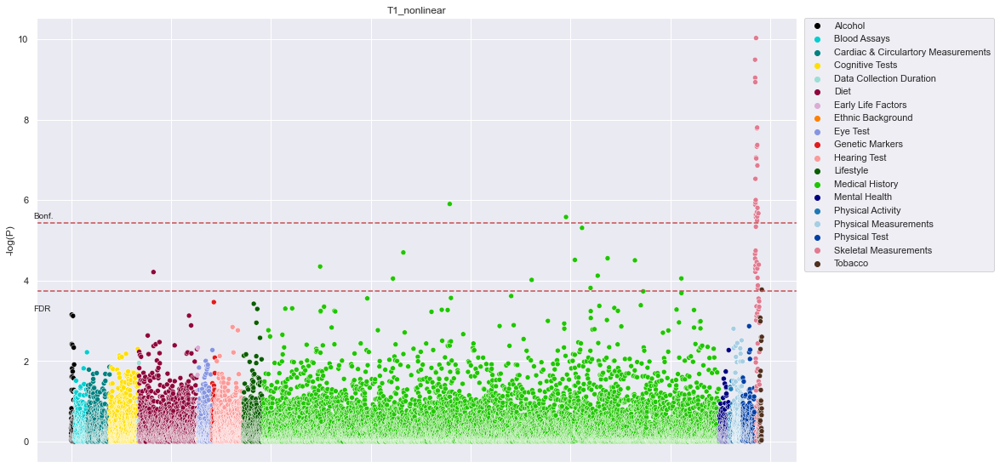

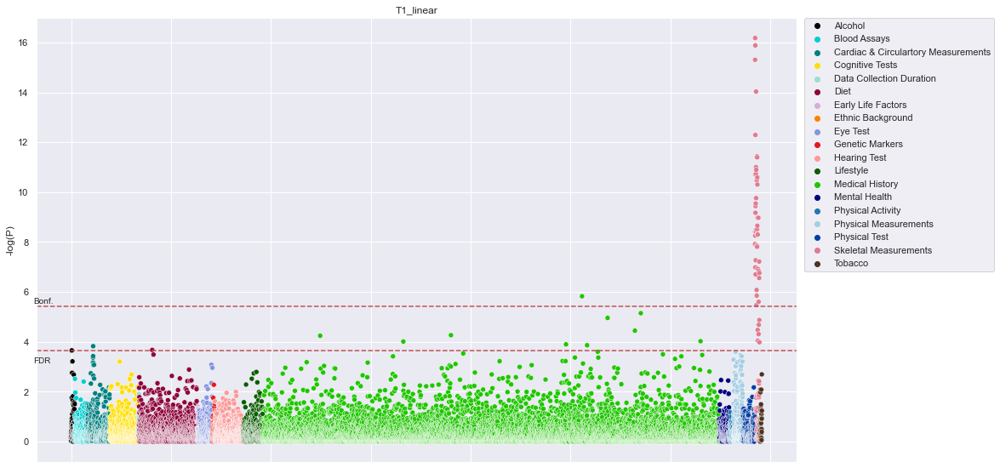

In [52]:
vars_corrs = []
vars_mods = []
vars_bnf_thrs = []
vars_fdr_thrs = []

for idx in range(len(df)):
    df_mod = df.iloc[idx].dataframe
    modality = df.iloc[idx].modality
    age_delta_decon = df_mod.age_delta_decon.to_numpy()
    subjects = df_mod['Unnamed: 0'].to_numpy()
    subjects, age_delta_decon = align_subjects(subjects, subjects_h5, 
                                                  age_delta_decon, subjects_to_be_ignored)
    
    if deconfound_flag == True:
        age_delta_decon = deconfound_inputs(age_delta_decon)
        
        
    corr_df, bonferroni_threshold, false_discovery_rate = correlations_and_plots(
                                    age_delta_decon = age_delta_decon, deconf_subset = vars_i_deconf_subset, 
                                    names_subset = varsHeader_subset, idxs = varsIDX_subset,
                                    categories_subset = vars_categories_subset,
                                    title = modality, corr_flag='vars')
    vars_mods.append(modality)
    vars_corrs.append(corr_df)
    vars_bnf_thrs.append(bonferroni_threshold)
    vars_fdr_thrs.append(false_discovery_rate)
    
    if idx == 1:
        break
    
vars_df = pd.DataFrame.from_dict({
    'modality': vars_mods,
    'bonf': vars_bnf_thrs,
    'fdr': vars_fdr_thrs,
    'dataframe': vars_corrs
})

In [15]:
OrderedSubjects = df.iloc[0].dataframe["Unnamed: 0"].to_frame()

In [16]:
OrderedSubjects.to_pickle('OrderedSubjects.pkl', protocol = 4)

In [17]:
def align_subjectsMod(subjects_df, subjects_h5, age_delta_decon, subjects_to_be_ignored, vars_i_deconf_subset, confounds):
    '''
    Here we make sure that the subjects match between the results and the nIDP/IDP dataframes
    The subjects_df uses slightly older data, and subjects might have left the study since it's generation
    If need be, this will be corrected at a later stage!
    '''
    
    if len(subjects_df) == len(subjects_h5):
        assert (subjects_df == subjects_h5).all()
    else:
        if len(subjects_df) < len(subjects_h5):
            subjects_to_be_ignored = list(set(subjects_h5) - set(subjects_df))
#             print(subjects_df.shape)
#             print(subjects_h5.shape)
#             print(subjects_to_be_ignored)
            idx_elim = np.where(subjects_h5 == subjects_to_be_ignored)[0][0]
            subjects_h5 = np.delete(subjects_h5, idx_elim)
            assert (subjects_df == subjects_h5).all()
            vars_i_deconf_subset = np.delete(vars_i_deconf_subset, idx_elim, axis=0)
#             print(confounds.shape)
            confounds = np.delete(confounds, idx_elim, axis=0)
#             print(confounds.shape)
#             print(idx_elim)
        else:
            idx_elim = np.where(subjects_df == subjects_to_be_ignored)[0][0]
            subjects_df = np.delete(subjects_df, idx_elim)
            assert (subjects_df == subjects_h5).all()
            age_delta_decon = np.delete(age_delta_decon, idx_elim)
    return subjects_df, subjects_h5, age_delta_decon, subjects_to_be_ignored, vars_i_deconf_subset, confounds

def deconfound_inputsMod(y, confounds):
    
    y = y - y.mean(axis=0)
    if np.sum(np.isnan(y)) == 0:
        beta = np.linalg.pinv(confounds).dot(y)
        beta[np.abs(beta) < 1e-10] = 0
        yd = y - confounds.dot(beta)
        yd = yd - yd.mean()
    else:
        print('ERROR! Encoundered a NaN! Function Needs Updating!')
    
    return yd

In [18]:
df_mod

NameError: name 'df_mod' is not defined

In [19]:
df_mod = df2.iloc[1].dataframe
df_mod = OrderedSubjects.merge(df_mod)
modality = df2.iloc[1].modality
age_delta_decon = df_mod.age_delta_decon.to_numpy()
subjects = df_mod['Unnamed: 0'].to_numpy()
subjects_df, subjects_h5, age_delta_decon, subjects_to_be_ignored, vars_i_deconf_subset, confounds = subjects, subjects_h5, age_delta_decon, subjects_to_be_ignored, vars_i_deconf_subset, confounds


In [58]:
vars_i_deconf_subset.shape

(2511, 13835)

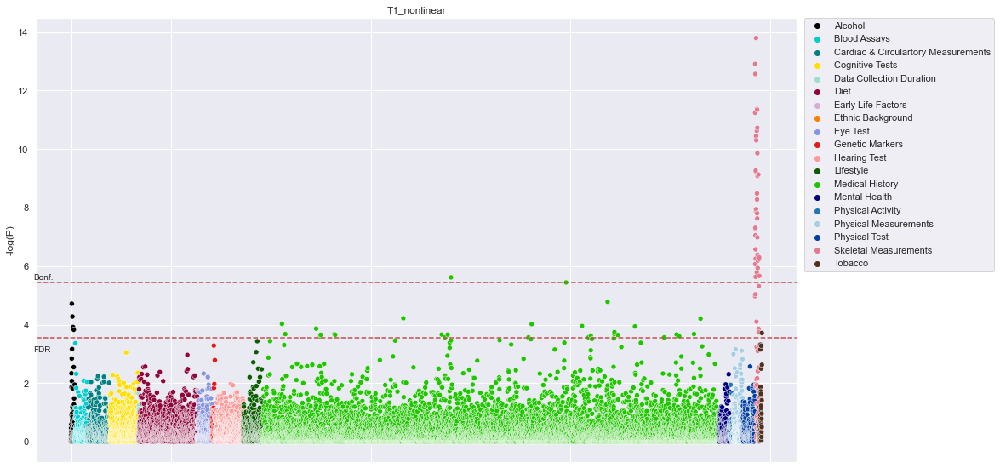

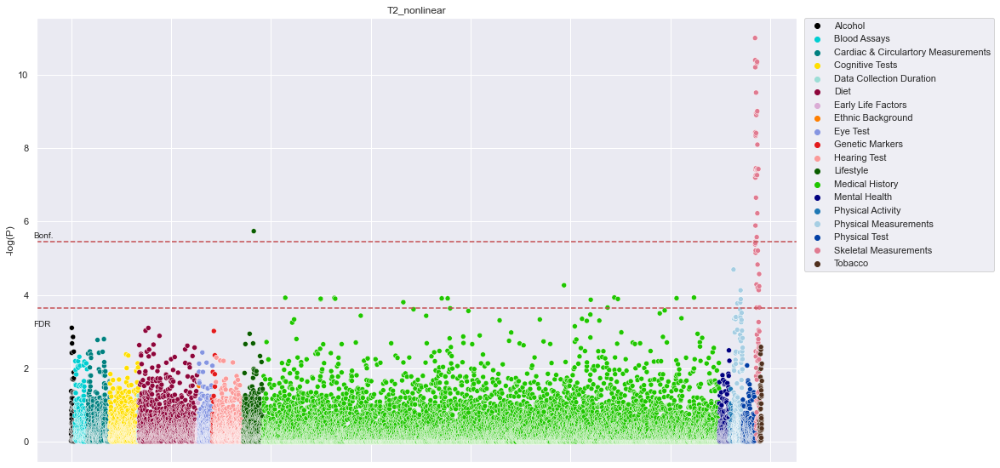

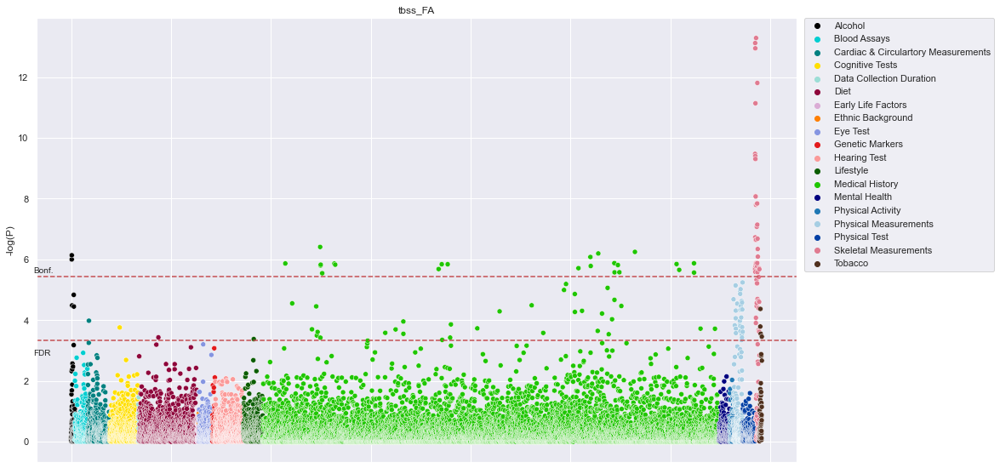

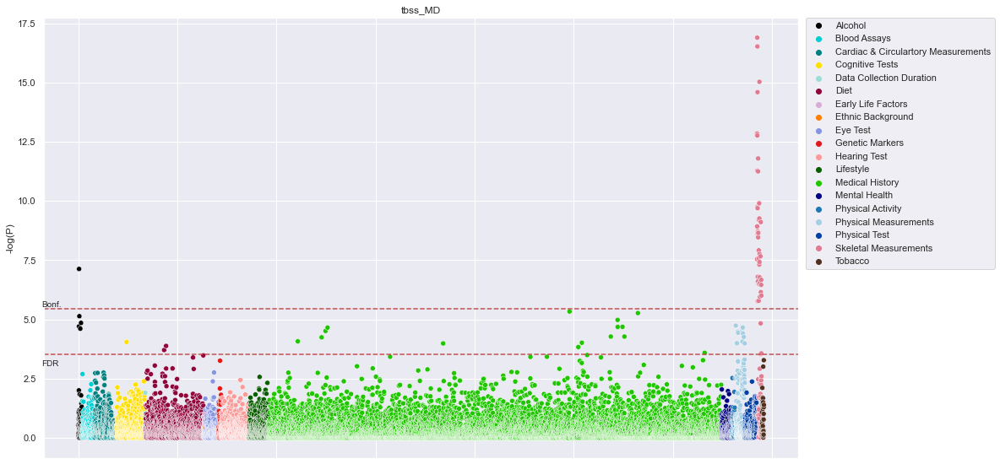

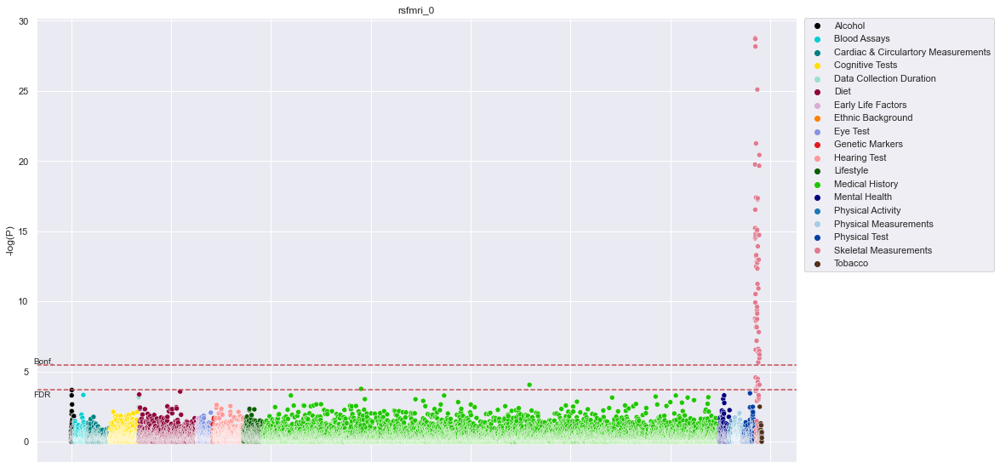

...

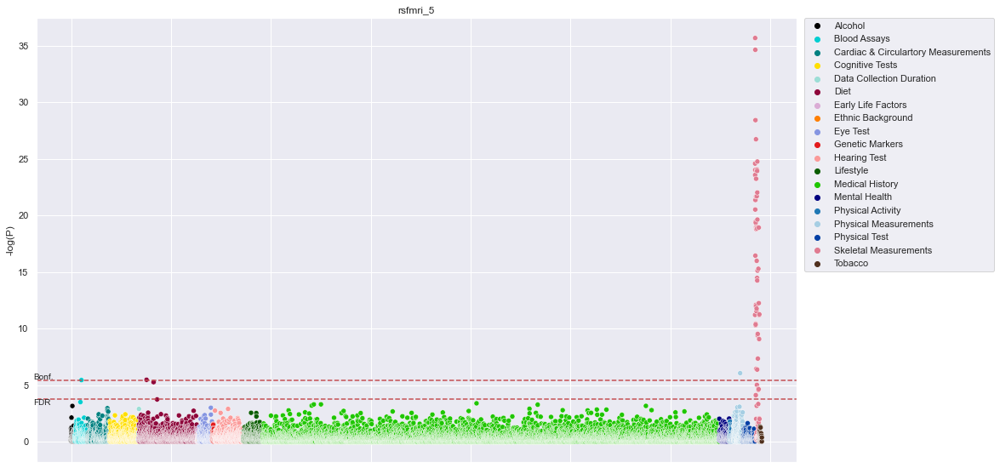

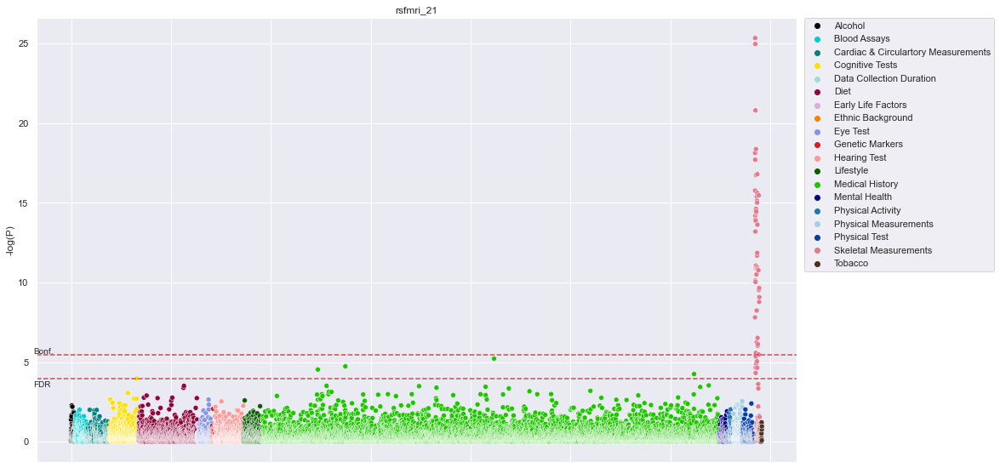

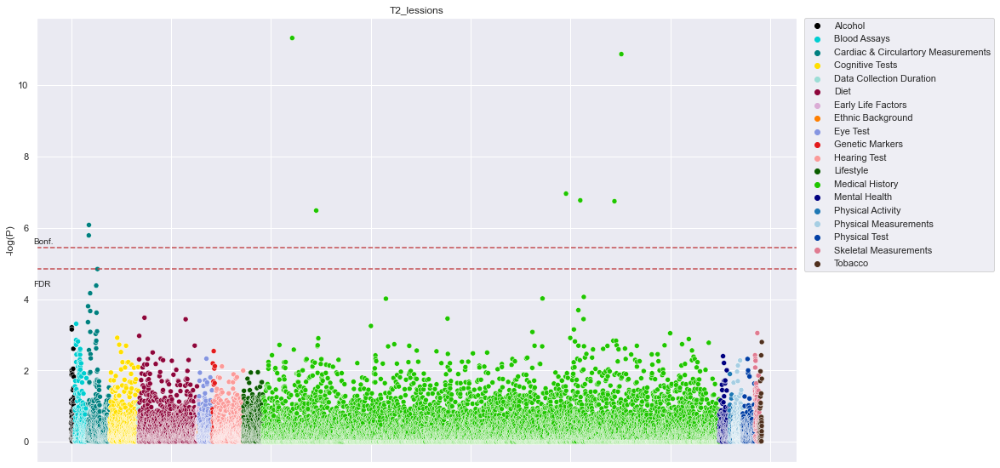

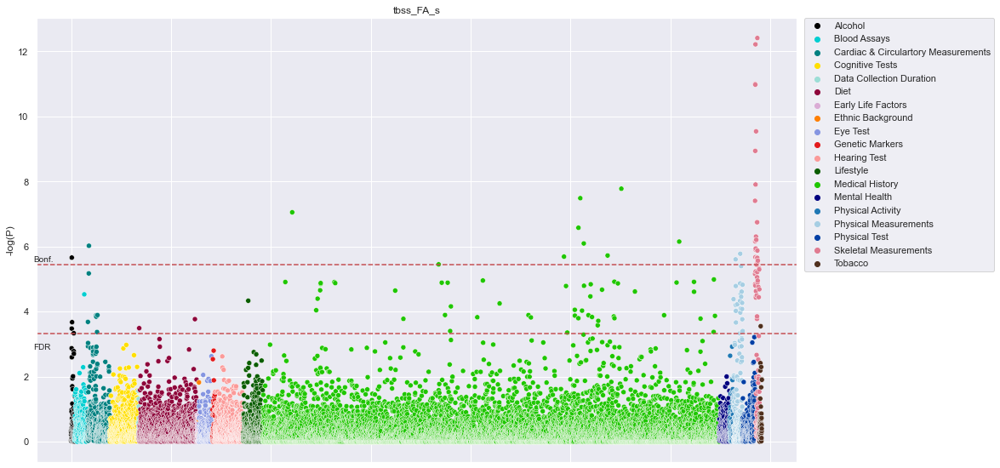

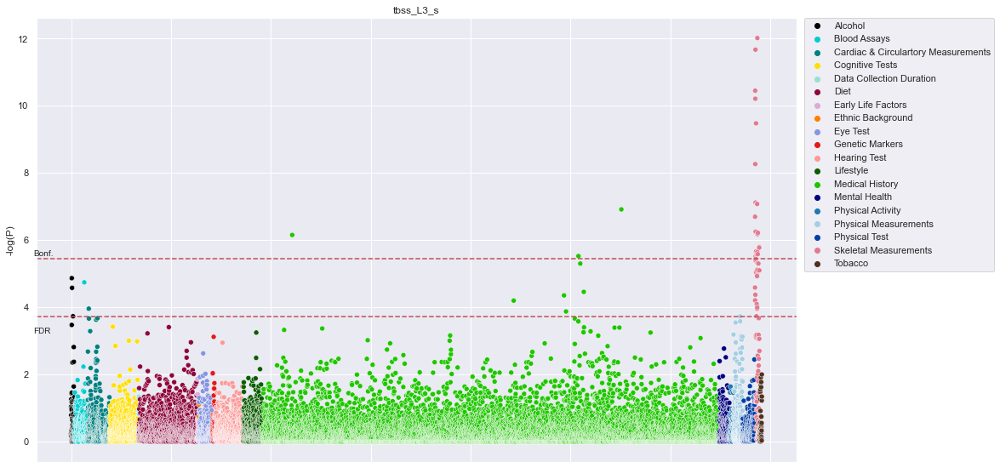

In [59]:
vars_corrs = []
vars_mods = []
vars_bnf_thrs = []
vars_fdr_thrs = []

for idx in range(len(df2)):
    df_mod = df2.iloc[idx].dataframe
    df_mod = OrderedSubjects.merge(df_mod)
    modality = df2.iloc[idx].modality
    age_delta_decon = df_mod.age_delta_decon.to_numpy()
    subjects = df_mod['Unnamed: 0'].to_numpy()
    subjects, subjects_h5, age_delta_decon, subjects_to_be_ignored, vars_i_deconf_subset, confounds = align_subjectsMod(
        subjects, 
        subjects_h5, 
        age_delta_decon, 
        subjects_to_be_ignored,
        vars_i_deconf_subset,
        confounds)
    
    if deconfound_flag == True:
        age_delta_decon = deconfound_inputsMod(age_delta_decon, confounds)
        
    corr_df, bonferroni_threshold, false_discovery_rate = correlations_and_plots(
                                    age_delta_decon = age_delta_decon, deconf_subset = vars_i_deconf_subset, 
                                    names_subset = varsHeader_subset, idxs = varsIDX_subset,
                                    categories_subset = vars_categories_subset,
                                    title = modality, corr_flag='vars')
    vars_mods.append(modality)
    vars_corrs.append(corr_df)
    vars_bnf_thrs.append(bonferroni_threshold)
    vars_fdr_thrs.append(false_discovery_rate)
    
#     if idx == 0:
#         break
    
vars_df = pd.DataFrame.from_dict({
    'modality': vars_mods,
    'bonf': vars_bnf_thrs,
    'fdr': vars_fdr_thrs,
    'dataframe': vars_corrs
})

In [60]:
subjects

array([25731272, 23327192, 21569423, ..., 23169754, 25240989, 22940930])

In [61]:
vars_df.to_pickle('female_vars_testB_convergence9.pkl', protocol = 4)

In [25]:
!ls '../../multi-age-mapper/Analysis Female - Variance Study/female_vars_testB_convergence9.pkl'

../../multi-age-mapper/Analysis Female - Variance Study/female_vars_testB_convergence9.pkl


In [26]:
dfx  = pd.read_pickle('../../multi-age-mapper/Analysis Female - Variance Study/female_vars_testB_convergence9.pkl')
df2x = pd.read_pickle('female_vars_testB_convergence9.pkl')


In [27]:
dfx

,modality,bonf,fdr,dataframe
0,T1_nonlinear,5.442009,3.722608,idx ...
1,T2_nonlinear,5.442009,3.643544,idx ...
2,tbss_FA,5.442009,3.258847,idx ...
3,tbss_MD,5.442009,3.452753,idx ...
4,rsfmri_0,5.442009,3.389271,idx ...
5,swi,5.442009,3.490886,idx ...
6,tfmri_1,5.442009,3.608196,idx ...
7,tracts,5.442009,3.403591,idx ...
8,tbss_MO,5.442009,3.494445,idx ...
9,tbss_ISOVF_s,5.442009,3.308815,idx ...


In [28]:
df2x

,modality,bonf,fdr,dataframe
0,T1_nonlinear,5.442009,3.562704,idx ...
1,T2_nonlinear,5.442009,3.632591,idx ...
2,tbss_FA,5.442009,3.324640,idx ...
3,tbss_MD,5.442009,3.537301,idx ...
4,rsfmri_0,5.442009,3.681922,idx ...
5,swi,5.442009,3.651473,idx ...
6,tfmri_1,5.442009,3.533512,idx ...
7,tracts,5.442009,3.474175,idx ...
8,tbss_MO,5.442009,3.482356,idx ...
9,tbss_ISOVF_s,5.442009,3.499444,idx ...


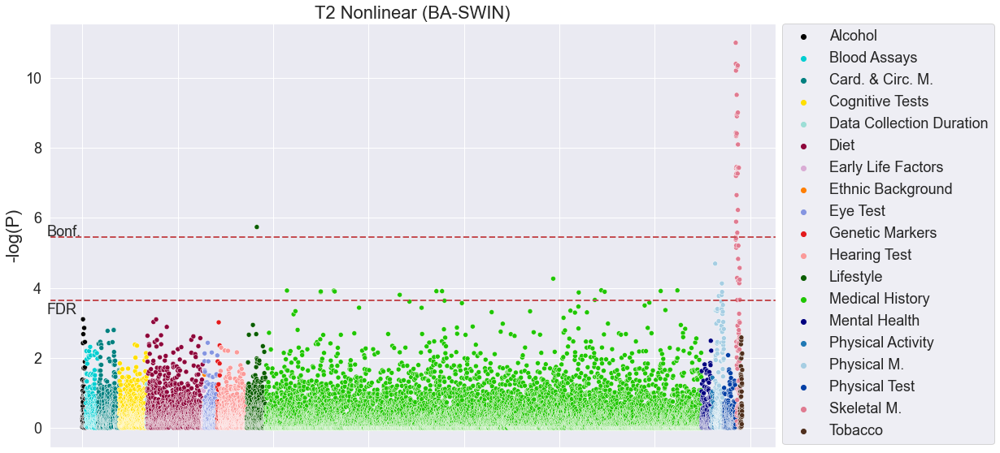

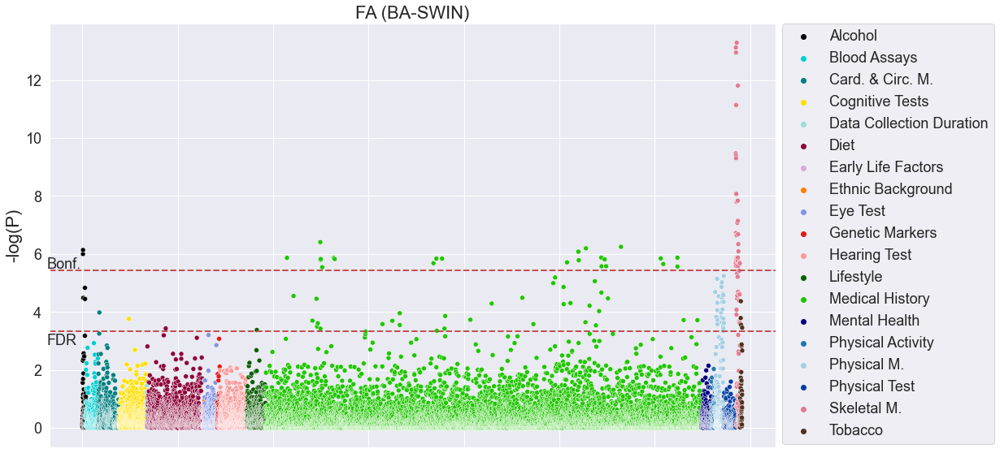

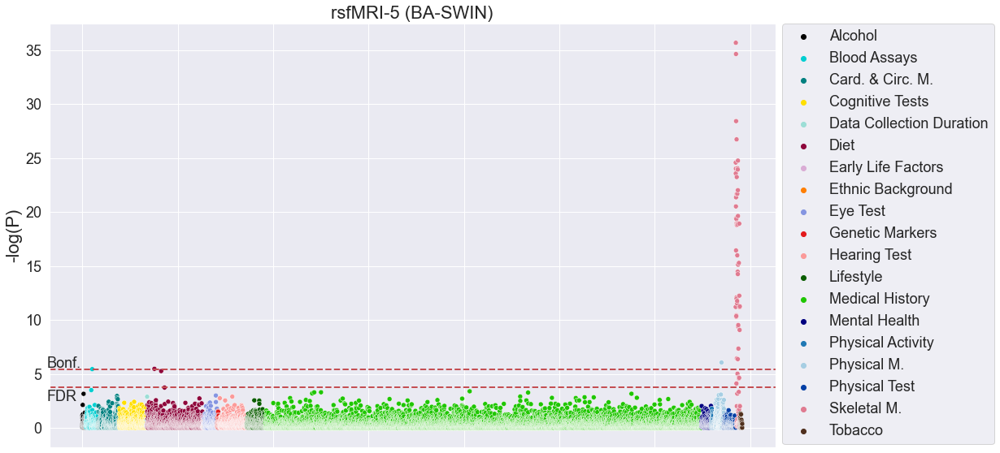

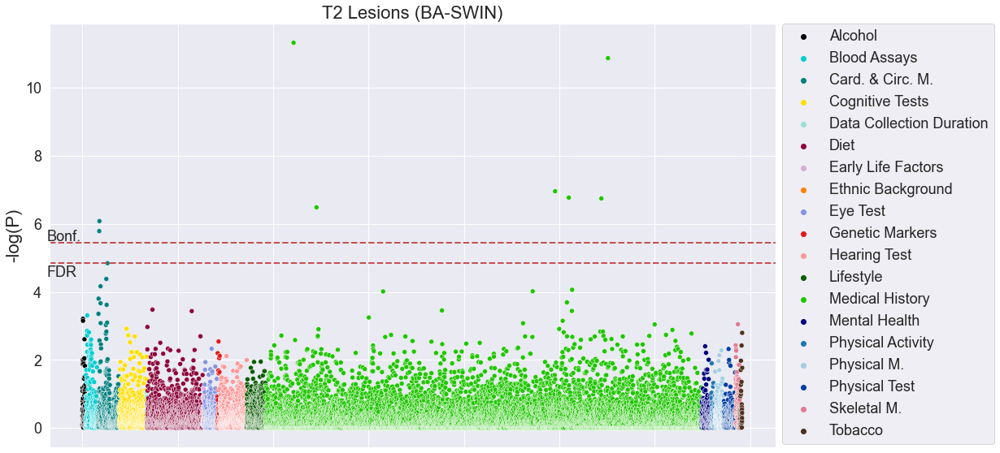

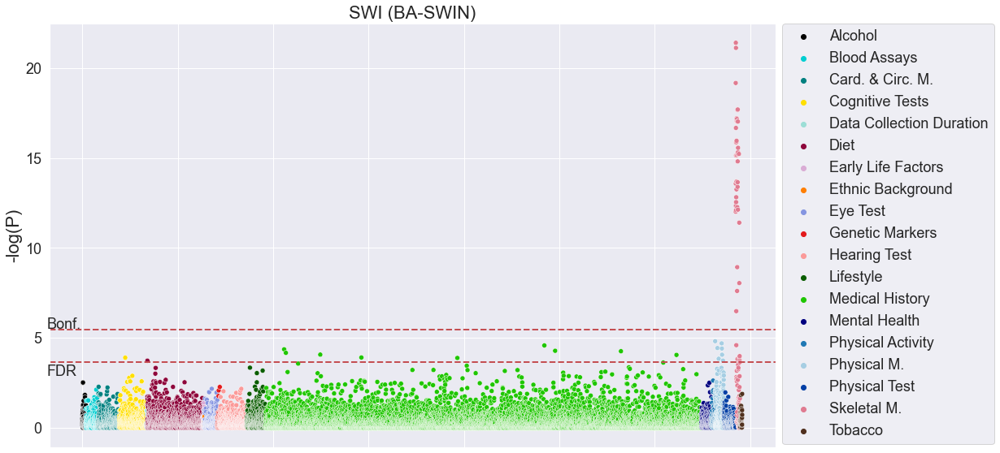

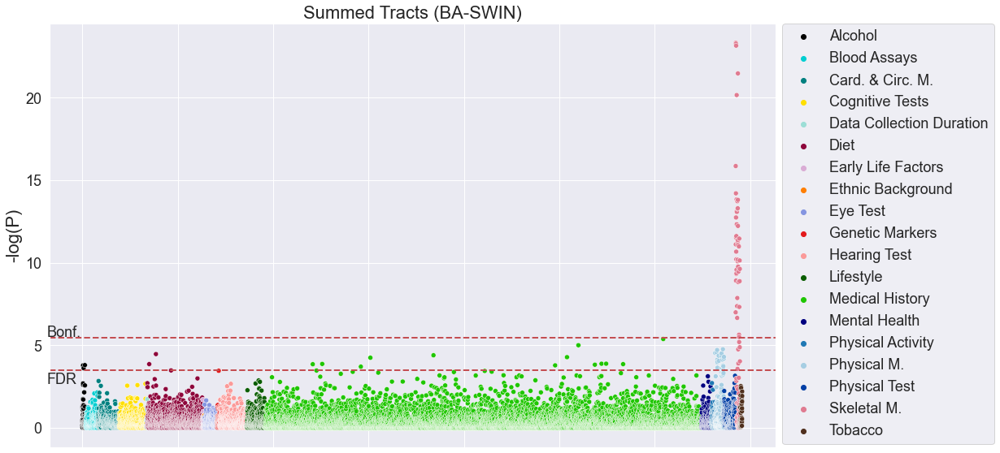

In [32]:
def correlations_and_plots_replot(corr_df, bonferroni_threshold, false_discovery_rate, title,
                                 figsize,
                                  ticks_font_size,
                                  title_font_size,
                                  legend_font,
                                  save_title,
                                  ylabel = '-log(P)',
                                  legend_ncol = None
                                 ):


    colorCycle=['#000000', '#00CED1','#008080','#ffdf00','#9cded6','#8e063b','#DAACD5','#ff7f00','#8595e1','#e31a1c','#fb9a99','#0a5d00','#1fc600','#000080','#1f78b4','#a6cee3', '#023fa5', '#e07b91', '#50301e']
    x_text_location = -750
    bonferroni_threshold_text = 0.00429570699569 * corr_df.log_p_values.values.max()
    false_discovery_rate_text = - 0.03436565596552 * corr_df.log_p_values.values.max()


    fig = plt.figure(figsize=figsize)
    sns.scatterplot(data=corr_df.sort_values('Categories'), x=np.arange(0,len(corr_df)), 
                y='log_p_values', hue='Categories', palette=colorCycle)  

    plt.ylabel(ylabel, fontsize=title_font_size)
    plt.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=False) # labels along the bottom edge are off
    plt.axhline(y = bonferroni_threshold, linestyle='--', color='r',  linewidth = 2)
    plt.text(x=x_text_location, y=bonferroni_threshold + bonferroni_threshold_text, s='Bonf.', fontsize=legend_font)
    if false_discovery_rate is not None:
        plt.axhline(y = false_discovery_rate, linestyle='--', color='r',  linewidth = 2)
        plt.text(x=x_text_location, y=false_discovery_rate + false_discovery_rate_text, s='FDR', fontsize=legend_font)
    
    if legend_ncol == None:
        plt.legend(bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0., fontsize=legend_font)
    else:
        plt.legend(fontsize=legend_font, bbox_to_anchor=(0.5, -0.75), loc='lower center', ncol=legend_ncol)
    
    plt.title(title, fontsize=title_font_size)
    plt.xticks(fontsize= ticks_font_size)
    plt.yticks(fontsize= ticks_font_size)
    
    fig.savefig(save_title, bbox_inches='tight')
    
    

titles = [
    'T2 Nonlinear', 'FA', 'rsfMRI-5', 'T2 Lesions', 'SWI', 'Summed Tracts'
]

modality_indexes = [1, 2, 13, 15, 5, 7]

save_title = 'Manhattan_Plots'

title_font_size=22
ticks_font_size=18
legend_font = 18
figsize=(16, 9.6)

i = 0

for idx in modality_indexes:
    corr_df = df2x.iloc[idx].dataframe
    
    corr_df.loc[corr_df['Categories'] == 'Cardiac & Circulartory Measurements', 'Categories'] = 'Card. & Circ. M.'
    corr_df.loc[corr_df['Categories'] == 'Physical Measurements', 'Categories'] = 'Physical M.'
    corr_df.loc[corr_df['Categories'] == 'Skeletal Measurements', 'Categories'] = 'Skeletal M.'
    
    
    bonferroni_threshold = df2x.iloc[idx].bonf
    false_discovery_rate = df2x.iloc[idx].fdr
    title = df2x.iloc[idx].modality
    
    tmp_save_title = save_title + '_' + titles[i] + '_SWIN.png'
    
    correlations_and_plots_replot(corr_df=corr_df, 
                                   bonferroni_threshold=bonferroni_threshold, 
                                   false_discovery_rate=false_discovery_rate,
                                   title=titles[i] + ' (BA-SWIN)',
                                  figsize=figsize,
                                  ticks_font_size = ticks_font_size,
                                  title_font_size = title_font_size,
                                  legend_font = legend_font,
                                  save_title = tmp_save_title
                                  )

    i+=1

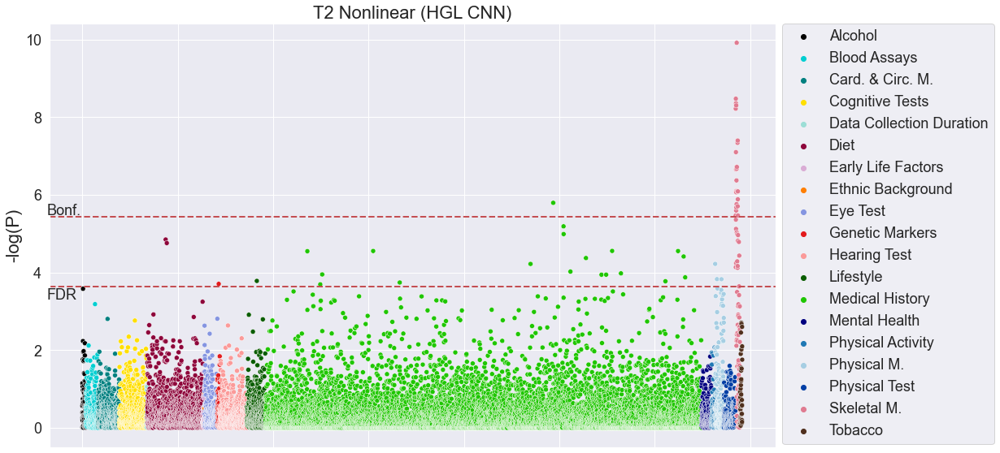

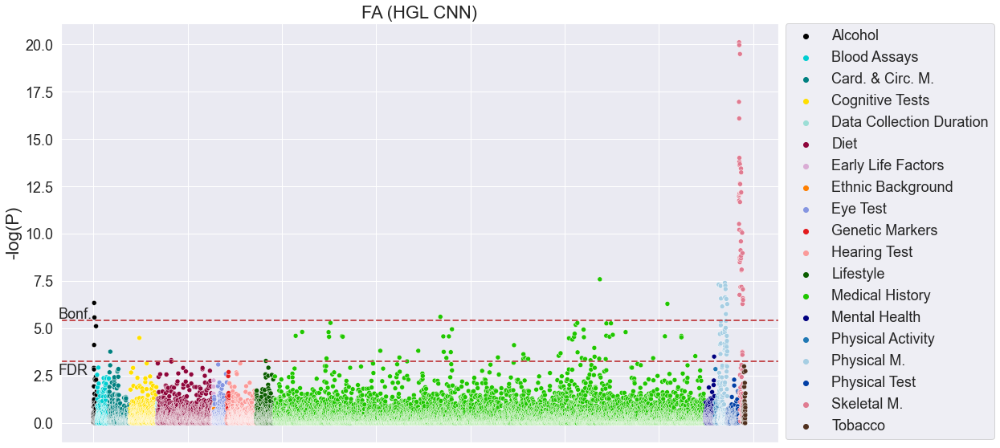

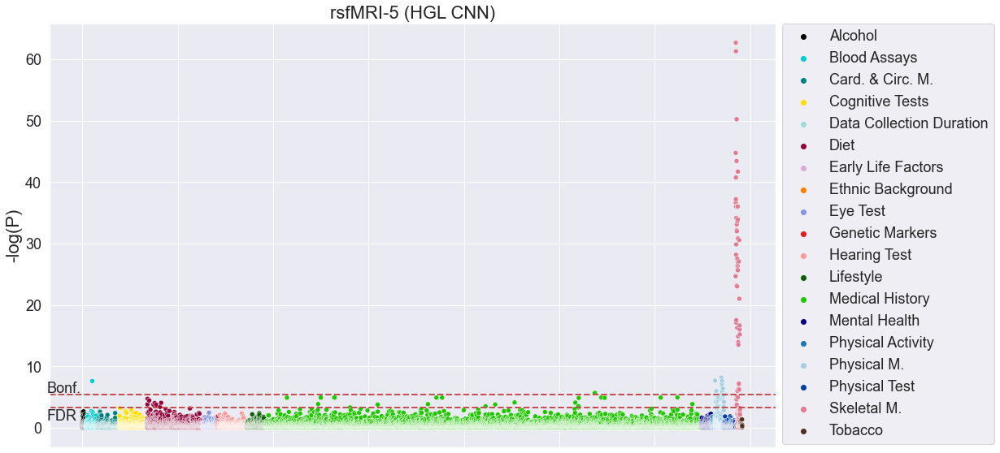

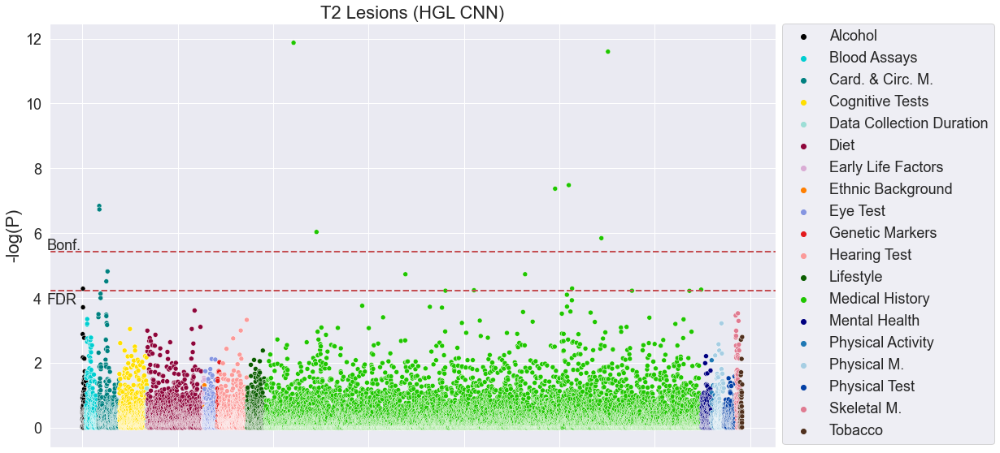

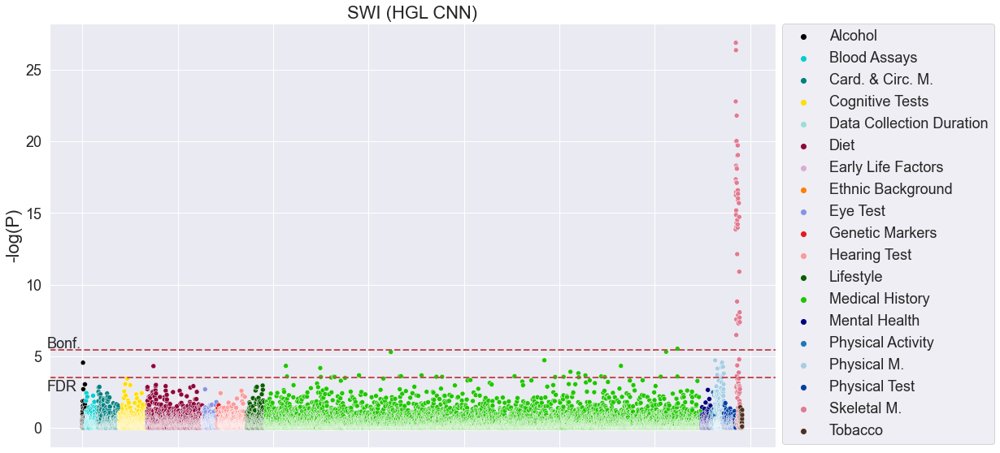

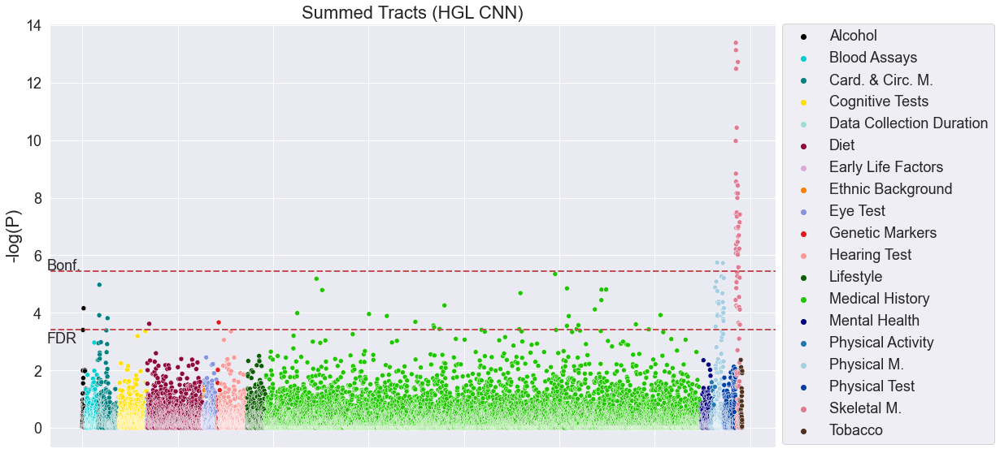

In [33]:
titles = [
    'T2 Nonlinear', 'FA', 'rsfMRI-5', 'T2 Lesions', 'SWI', 'Summed Tracts'
]

modality_indexes = [1, 2, 13, 15, 5, 7]

save_title = 'Manhattan_Plots'

title_font_size=22
ticks_font_size=18
legend_font = 18
figsize=(16, 9.6)

i = 0

for idx in modality_indexes:
    corr_df = dfx.iloc[idx].dataframe
    
    corr_df.loc[corr_df['Categories'] == 'Cardiac & Circulartory Measurements', 'Categories'] = 'Card. & Circ. M.'
    corr_df.loc[corr_df['Categories'] == 'Physical Measurements', 'Categories'] = 'Physical M.'
    corr_df.loc[corr_df['Categories'] == 'Skeletal Measurements', 'Categories'] = 'Skeletal M.'
    
    
    bonferroni_threshold = dfx.iloc[idx].bonf
    false_discovery_rate = dfx.iloc[idx].fdr
    title = dfx.iloc[idx].modality
    
    tmp_save_title = save_title + '_' + titles[i] + '_CNN.png'
    
    correlations_and_plots_replot(corr_df=corr_df, 
                                   bonferroni_threshold=bonferroni_threshold, 
                                   false_discovery_rate=false_discovery_rate,
                                   title=titles[i] + ' (HGL CNN)',
                                  figsize=figsize,
                                  ticks_font_size = ticks_font_size,
                                  title_font_size = title_font_size,
                                  legend_font = legend_font,
                                  save_title = tmp_save_title
                                  )

    i+=1

In [34]:
def bland_altman_plot(df, modality, metric, heatmap=False, bonf=None, fdr=None):
    if metric == '-log(P)':
        colData1 = 'log_p_values_x'
        colData2 = 'log_p_values_y'
    elif metric == 'Pearson R':
        colData1 = 'pearson_r_x'
        colData2 = 'pearson_r_y'
    elif metric == 'Pearson R Abs':
        colData1 = 'abs_pearson_r_x'
        colData2 = 'abs_pearson_r_y'
    else:
        return
    data1     = df[colData1].to_numpy()
    data2     = df[colData2].to_numpy()
    mean      = np.mean([data1, data2], axis=0)
    diff      = data1 - data2                   # Difference between data1 and data2
    md        = np.mean(diff)                   # Mean of the difference
    sd        = np.std(diff, axis=0)            # Standard deviation of the difference
    CI_low    = md - 1.96*sd
    CI_high   = md + 1.96*sd
    CI_perc = len(np.where((diff>=CI_low) & (diff <= CI_high))[0]) / len(diff)
    CI_perc = round(CI_perc, 3) * 100

    plt.figure(figsize=(9.6, 7.2), facecolor='white')
    
    if heatmap == False:
        colorCycle=['#000000', '#00CED1','#008080','#ffdf00','#9cded6','#8e063b','#DAACD5','#ff7f00','#8595e1','#e31a1c','#fb9a99','#0a5d00','#1fc600','#000080','#1f78b4','#a6cee3', '#023fa5', '#e07b91', '#50301e']
        sns.scatterplot(data=df, x=mean, y=diff, hue='Categories_x', palette=colorCycle)
    else:
        sns.set_style("darkgrid", {'image.cmap': u'plasma'})
        x = mean
        y = diff
        xy = np.vstack((x,y))
        z = gaussian_kde(xy)
        z = z.evaluate(xy)

        idx = z.argsort()
        x, y, z = x[idx], y[idx], z[idx]
        plt.scatter(x,y,c=z)
        
    plt.axhline(md,           color='gray', linestyle='--', alpha=0.5)
    plt.axhline(md + 1.96*sd, color='gray', linestyle='--', alpha=0.5)
    plt.axhline(md - 1.96*sd, color='gray', linestyle='--', alpha=0.5)
    if bonf is not None:
        plt.axvline(bonf, color='red', linestyle='--', alpha=0.5)
        plt.text(x=bonf, y=min(diff), s='Bonf.')
    if fdr is not None:
        plt.axvline(fdr, color='red', linestyle='--', alpha=0.5)
        plt.text(x=fdr, y=min(diff), s='FDR.')
    
    xOutPlot = np.min(mean) + (np.max(mean)-np.min(mean))*1.14
    
    plt.text(xOutPlot, md - 1.96*sd, 
        r'-1.96SD:' + "\n" + "%.2f" % CI_low, 
        ha = "center",
        va = "center",
        )
    plt.text(xOutPlot, md + 1.96*sd, 
        r'+1.96SD:' + "\n" + "%.2f" % CI_high, 
        ha = "center",
        va = "center",
        )
    plt.text(xOutPlot, md, 
        r'Mean:' + "\n" + "%.2f" % md, 
        ha = "center",
        va = "center",
        )
    
    title = 'Bland-Altman Plot: ' + modality
    xlabel = metric + ' Means'
    ylabel = metric + ' Differences'
    
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    
    if heatmap==False:
        plt.plot([],[],' ',label= str(CI_perc) + '%')
        plt.legend(bbox_to_anchor=(1.21, 1), loc=2, borderaxespad=0.)
    
    
def scatter_plot_heatmap(x, y, xlabel, ylabel, title, equality_line=True, set_scale=False):
    
    x = x.to_numpy()
    y = y.to_numpy()
    
    fig = plt.figure(figsize=[7.2, 7.2], facecolor='white')
    sns.set_style("darkgrid", {'image.cmap': u'plasma'})
    xy = np.vstack([x,y])
    z = gaussian_kde(xy)(xy)
    # Sort the points by density, so that the densest points are plotted last
    idx = z.argsort()
    x, y, z = x[idx], y[idx], z[idx]
    plt.scatter(x,y,c=z,s=50)
    if equality_line == True:
        plt.plot(x, x, ls="-", color = sns.xkcd_rgb['black'], label='Equality Line') #this is just the line of equality
    
    X_mat=np.vstack((np.ones(len(x)), x)).T
    beta_hat = np.linalg.inv(X_mat.T.dot(X_mat)).dot(X_mat.T).dot(y)
    b,w = beta_hat[0],beta_hat[1]
    x2 = np.linspace(np.min(x),np.max(x),num=10)
    y2 = w * x2 + b
    plt.plot(x2,y2,ls='--', color= sns.xkcd_rgb['red'], label='Linear Regression Line')
    
    pearson_correlation = pearsonr(x,y)[0]
#     plt.text(np.max(x), np.min(y)+0.05*np.abs(np.min(y2)), 'R='+str(round(pearson_correlation,3)), horizontalalignment='right', fontsize='large')

In [37]:
df = pd.read_pickle('../../agemapper/Analsysis Female New/female_vars_testB.pkl')

In [38]:
df2 = pd.read_pickle('female_vars_testB_convergence9.pkl')

In [ ]:
df3 = 

In [65]:
df

,modality,bonf,fdr,dataframe
0,T1_nonlinear,5.442009,3.767651,idx ...
1,T1_linear,5.442009,3.650484,idx ...
2,jacobian,5.442009,3.676520,idx ...
3,vbm,5.442009,3.632807,idx ...
4,T2_nonlinear,5.442009,4.016448,idx ...
5,T2_lesions,5.442009,4.619157,idx ...
6,swi,5.442009,3.622588,idx ...
7,rsfmri_0,5.442009,3.368398,idx ...
8,rsfmri_1,5.442009,3.426090,idx ...
9,rsfmri_2,5.442009,3.333374,idx ...


In [66]:
df2

,modality,bonf,fdr,dataframe
0,T1_nonlinear,5.442009,3.562704,idx ...
1,T2_nonlinear,5.442009,3.632591,idx ...
2,tbss_FA,5.442009,3.324640,idx ...
3,tbss_MD,5.442009,3.537301,idx ...
4,rsfmri_0,5.442009,3.681922,idx ...
5,swi,5.442009,3.651473,idx ...
6,tfmri_1,5.442009,3.533512,idx ...
7,tracts,5.442009,3.474175,idx ...
8,tbss_MO,5.442009,3.482356,idx ...
9,tbss_ISOVF_s,5.442009,3.499444,idx ...


In [42]:
setNN = [
    'T1_nonlinear',           #1
    'T2_nonlinear',           #2
    'tbss_FA',                #3
    'tbss_MD',                #4
    'rsfmri_0',               #5
    'swi',                    #6
    'tfmri_1',                #7
    'tracts',                 #8
    'tbss_MO',                #9
    'tbss_ISOVF_s',           #10
    'tbss_L2',                #11
    'rsfmri_2',               #12
    'rsfmri_10',              #13
    'rsfmri_5',               #14
    'rsfmri_21',              #15
    'T2_lesions',            #16
    'tbss_FA_s',              #17
    'tbss_L3_s',              #18
]

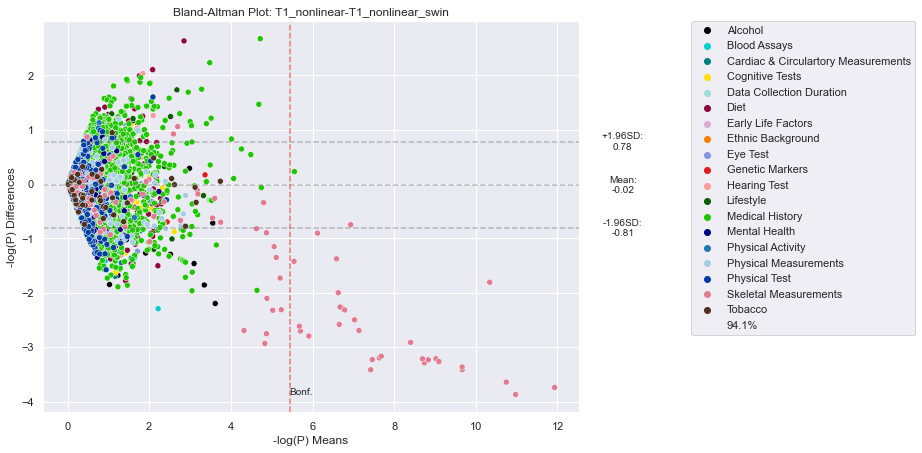

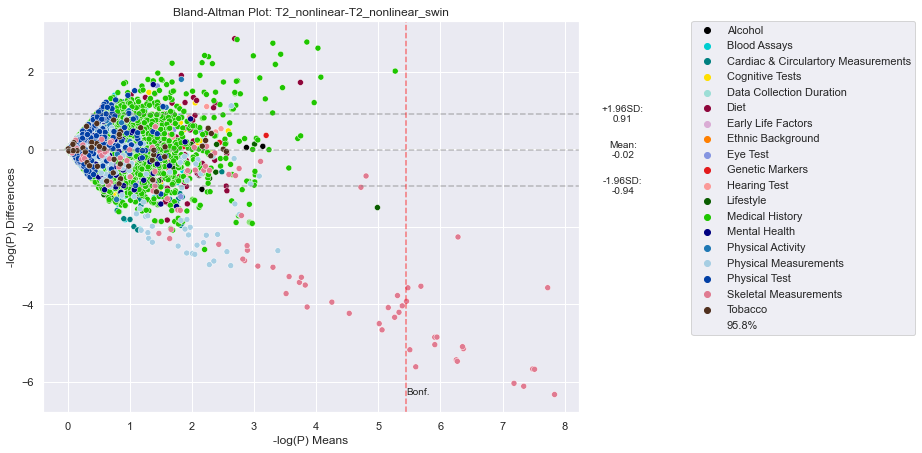

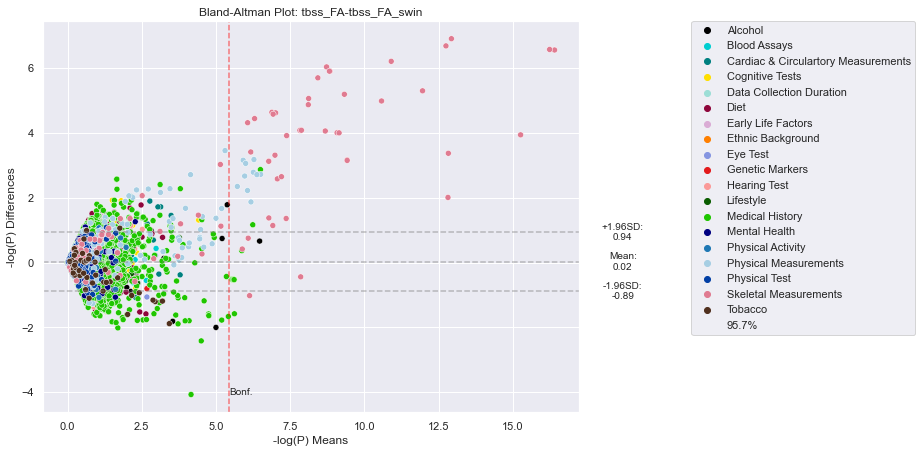

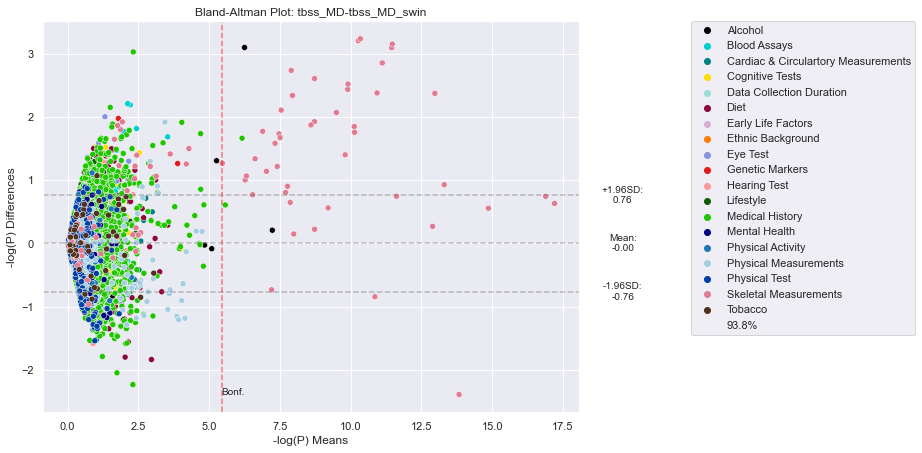

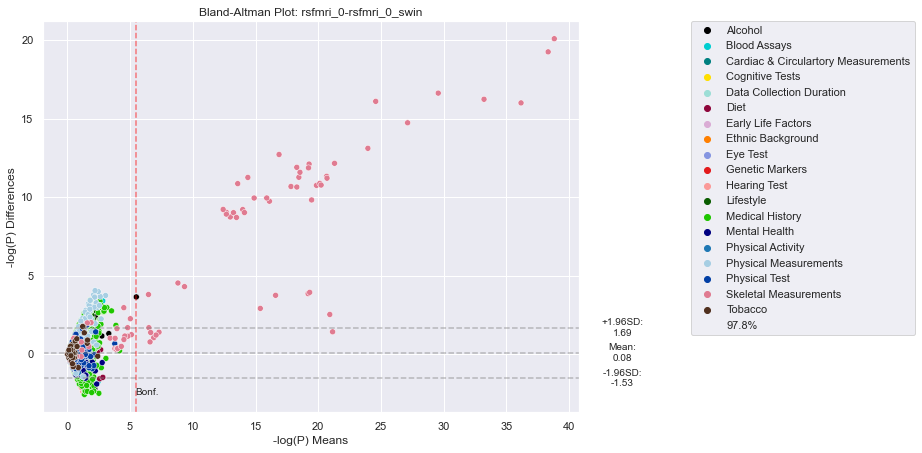

...

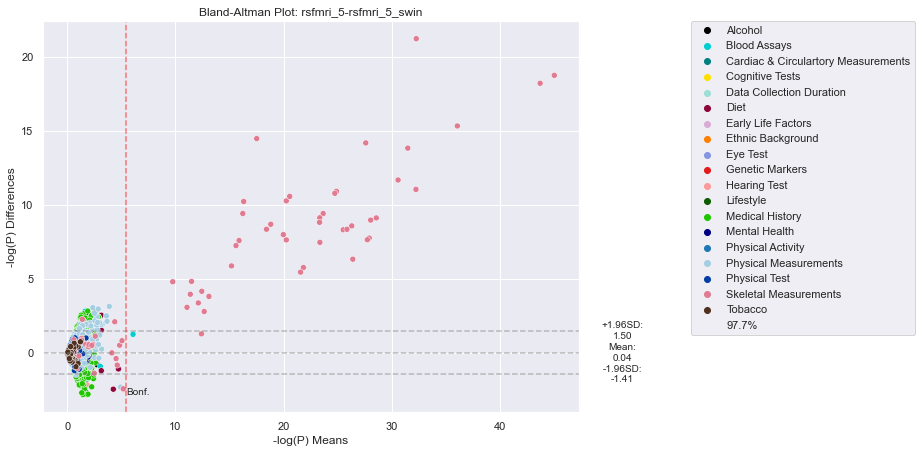

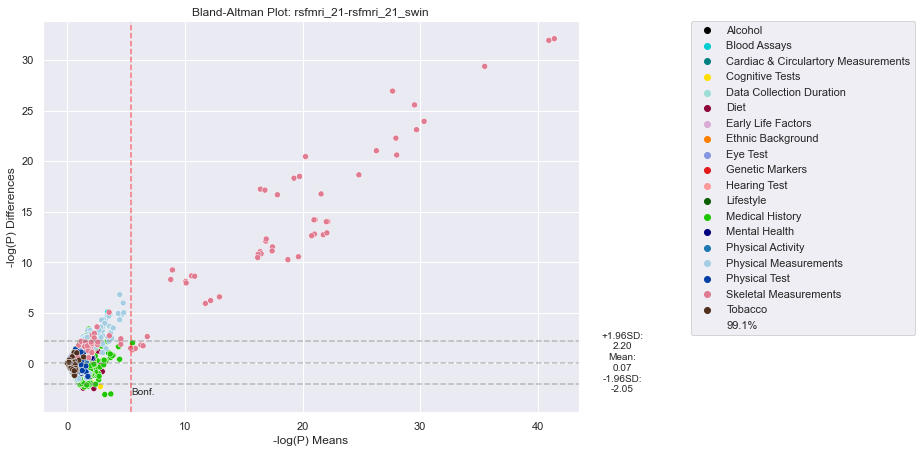

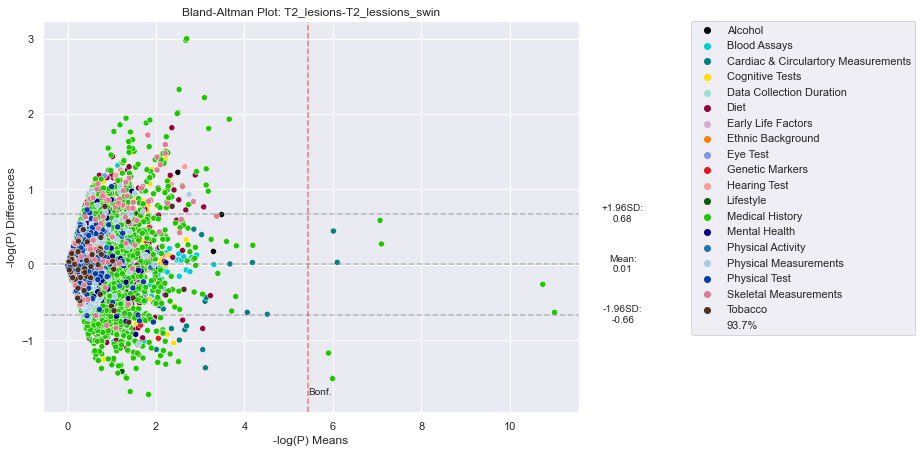

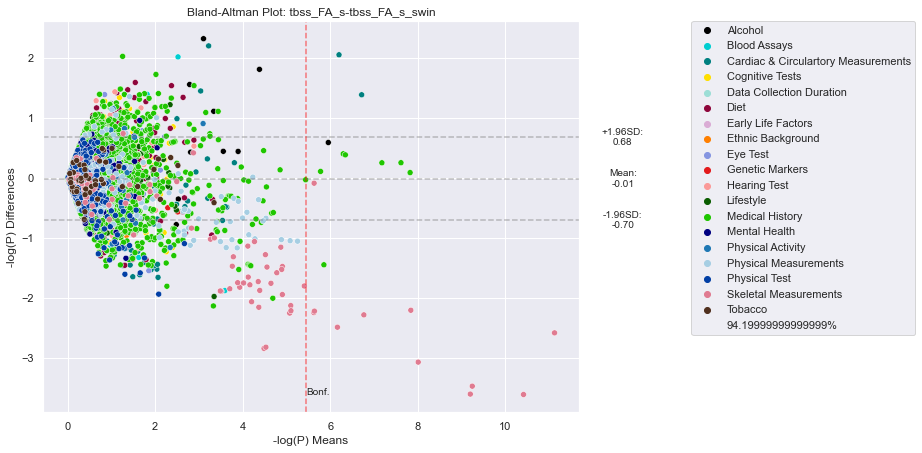

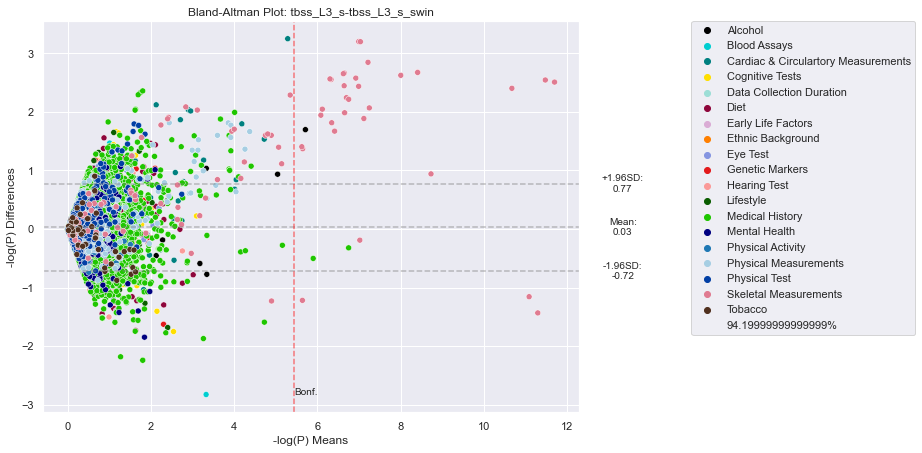

In [75]:
for idxNN in range(len(setNN)):
    idxDF = np.where(setNN[idxNN] == df.modality.to_numpy())[0][0]
    dfNN = df.iloc[idxDF].dataframe
    dfMM = df2.iloc[idxNN].dataframe
    modalityNN = df.iloc[idxDF].modality
    modalityMM = df2.iloc[idxNN].modality
    modality = modalityNN + '-' + modalityMM+'_swin'
    dfm = pd.merge(dfNN, dfMM, on='idx', how='inner')
    bonf = df.iloc[idxDF].bonf
    bland_altman_plot(dfm.sort_values('Categories_x'), modality = modality, metric='-log(P)',
                     bonf=bonf, 
#                       heatmap=True
                     )

In [69]:
dfNN = df.iloc[4].dataframe
dfMM = df2.iloc[1].dataframe
dfm = pd.merge(dfNN, dfMM, on='idx', how='inner')
bonf = (df.iloc[4].bonf + df2.iloc[1].bonf) / 2

colData1 = 'log_p_values_x'
colData2 = 'log_p_values_y'

dfm['diff'] = dfm[colData1].to_numpy() - dfm[colData2].to_numpy() 
dfm['mean'] = np.mean([dfm[colData1].to_numpy(), dfm[colData2].to_numpy()], axis=0)

dfm

,idx,names_x,Categories_x,pearson_r_x,t_test_statistic_x,p_values_corrected_x,p_values_x,abs_pearson_r_x,log_p_values_x,log_p_values_corrected_x,...,Categories_y,pearson_r_y,t_test_statistic_y,p_values_corrected_y,p_values_y,abs_pearson_r_y,log_p_values_y,log_p_values_corrected_y,diff,mean
0,0,Ethnic background (0.0),Ethnic Background,-0.012702,0.635648,1.000000,0.525064,0.012702,0.279788,-0.000000,...,Ethnic Background,-0.026598,1.331163,0.982851,0.183257,0.026598,0.736940,0.007512,-0.457153,0.508364
1,1,Ethnic background (1.0),Ethnic Background,0.014689,0.303922,1.000000,0.761335,0.014689,0.118424,-0.000000,...,Ethnic Background,-0.010989,0.227084,1.000000,0.820467,0.010989,0.085939,-0.000000,0.032485,0.102181
2,2,Ethnic background (2.0),Ethnic Background,-0.044404,1.193502,1.000000,0.233065,0.044404,0.632522,-0.000000,...,Ethnic Background,-0.080606,2.171448,0.617460,0.030223,0.080606,1.519667,0.209391,-0.887145,1.076095
3,3,Genotype measurement batch (0.0),Genetic Markers,-0.071164,3.531381,0.109904,0.000421,0.071164,3.375689,0.958986,...,Genetic Markers,-0.066609,3.303649,0.132609,0.000968,0.066609,3.014085,0.877427,0.361604,3.194887
4,4,Heterozygosity (0.0),Genetic Markers,-0.011057,0.547348,1.000000,0.584190,0.011057,0.233446,-0.000000,...,Genetic Markers,-0.006331,0.313327,1.000000,0.754059,0.006331,0.122595,-0.000000,0.110851,0.178020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13830,17507,Manifestations of mania or irritability (0.1),Mental Health,-0.009108,0.162928,1.000000,0.870678,0.009108,0.060143,-0.000000,...,Mental Health,-0.026397,0.471633,1.000000,0.637511,0.026397,0.195512,-0.000000,-0.135370,0.127827
13831,17514,Substances taken for anxiety (0.1),Mental Health,-0.045871,0.830374,1.000000,0.406933,0.045871,0.390477,-0.000000,...,Mental Health,-0.028609,0.516757,1.000000,0.605676,0.028609,0.217760,-0.000000,0.172717,0.304118
13832,17516,Activities undertaken to treat anxiety (0.1),Mental Health,-0.028277,0.509181,1.000000,0.610972,0.028277,0.213979,-0.000000,...,Mental Health,-0.045546,0.819414,1.000000,0.413155,0.045546,0.383887,-0.000000,-0.169909,0.298933
13833,17525,Ever been offered/sought treatment for anxiety...,Mental Health,0.001888,0.084736,1.000000,0.932479,0.001888,0.030361,-0.000000,...,Mental Health,-0.000994,0.044608,1.000000,0.964424,0.000994,0.015732,-0.000000,0.014629,0.023046


In [70]:
dfm[(dfm['diff'] > -2) & (dfm['mean'] > 5) & (dfm.Categories_x == 'Medical History')]

,idx,names_x,Categories_x,pearson_r_x,t_test_statistic_x,p_values_corrected_x,p_values_x,abs_pearson_r_x,log_p_values_x,log_p_values_corrected_x,...,Categories_y,pearson_r_y,t_test_statistic_y,p_values_corrected_y,p_values_y,abs_pearson_r_y,log_p_values_y,log_p_values_corrected_y,diff,mean
4772,8106,"Non-cancer illness code, self-reported (1220 -...",Medical History,0.099938,5.031091,0.007225,5.222007e-07,0.099938,6.282163,2.141183,...,Medical History,0.080434,4.041217,0.018043,0.000055,0.080434,4.26142,1.74369,2.020743,5.271791


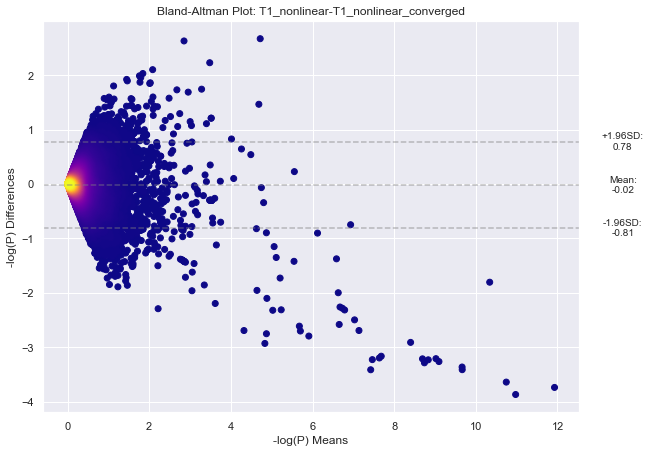

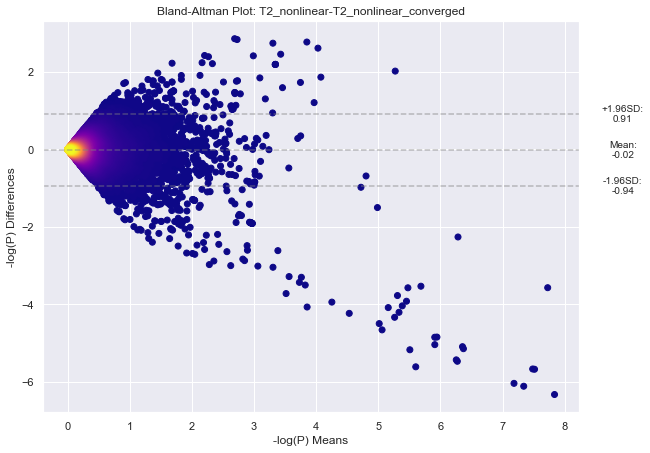

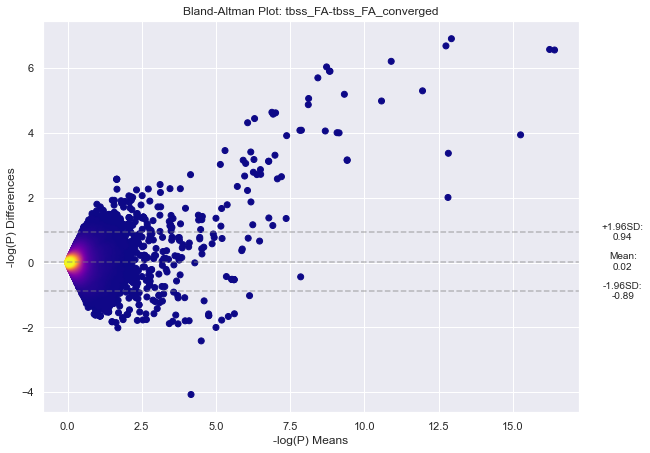

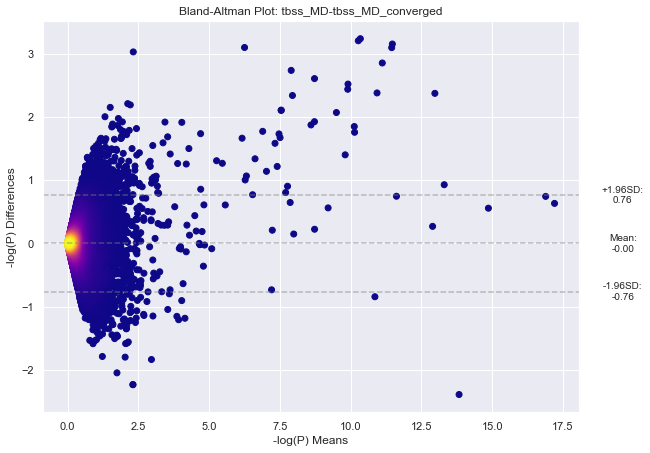

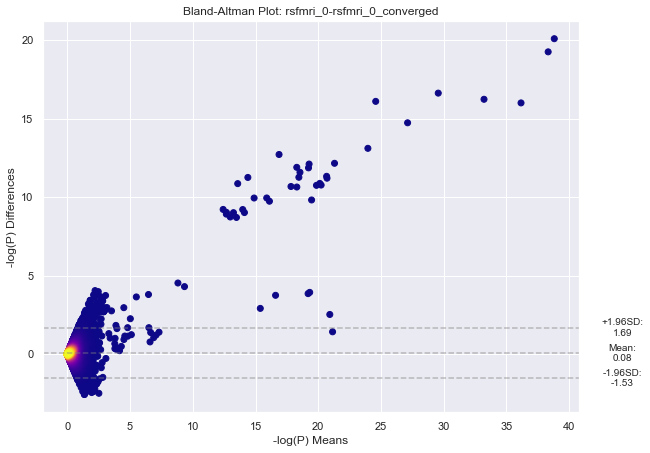

...

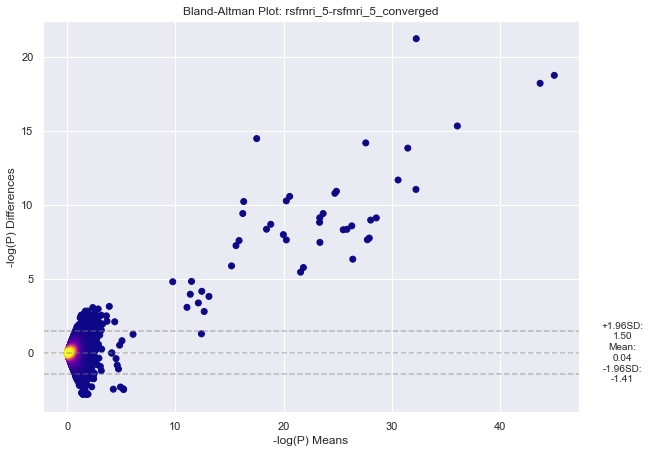

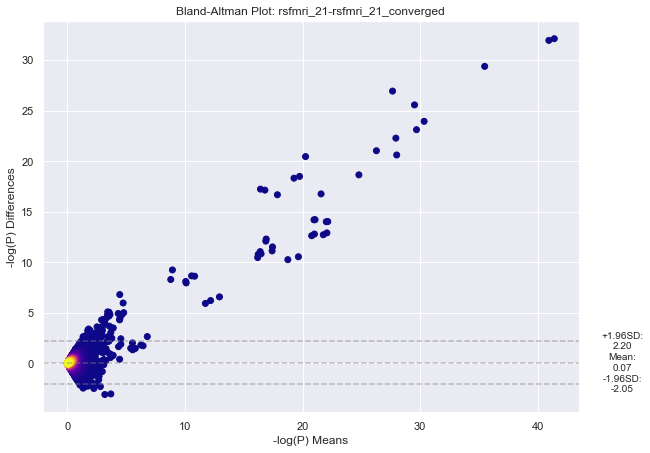

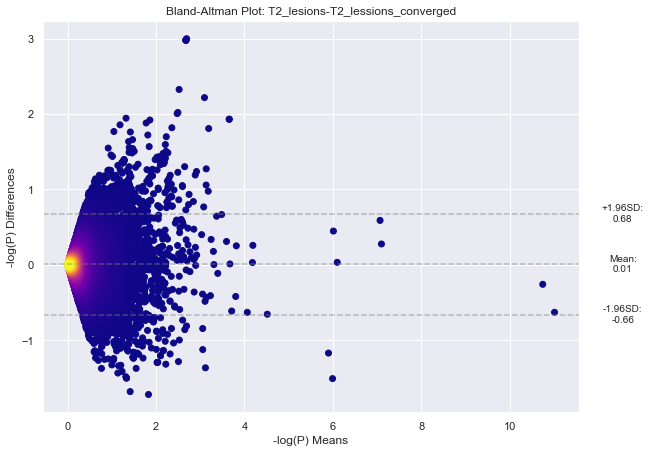

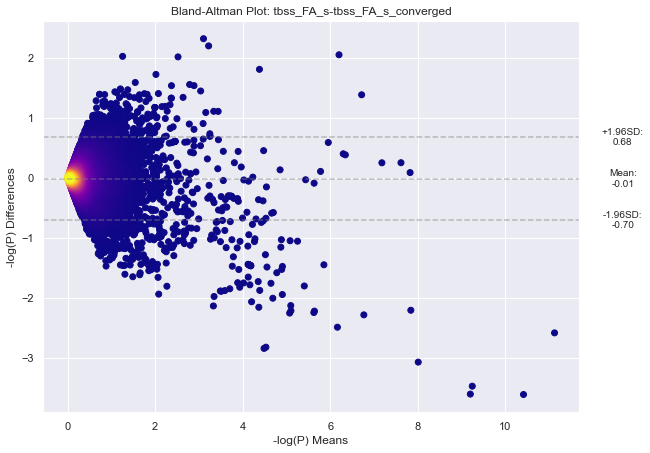

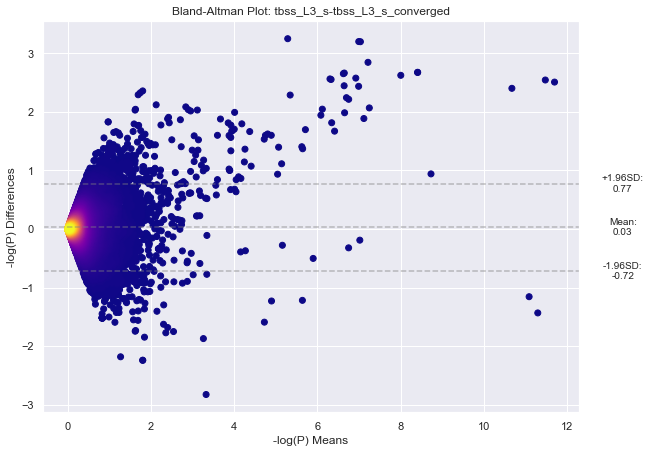

In [71]:
for idxNN in range(len(setNN)):
    idxDF = np.where(setNN[idxNN] == df.modality.to_numpy())[0][0]
    dfNN = df.iloc[idxDF].dataframe
    dfMM = df2.iloc[idxNN].dataframe
    modalityNN = df.iloc[idxDF].modality
    modalityMM = df2.iloc[idxNN].modality
    modality = modalityNN + '-' + modalityMM+'_converged'
    dfm = pd.merge(dfNN, dfMM, on='idx', how='inner')
    bonf = (df.iloc[idxDF].bonf + df2.iloc[idxNN].bonf) / 2
    bland_altman_plot(dfm.sort_values('Categories_x'), modality = modality, metric='-log(P)',
#                      bonf=bonf, 
                      heatmap=True
                     )

In [72]:
for idxNN in range(len(setNN)):
    idxDF = np.where(setNN[idxNN] == df.modality.to_numpy())[0][0]
    dfNN = df.iloc[idxDF].dataframe
    dfMM = df2.iloc[idxNN].dataframe
    modalityNN = df.iloc[idxDF].modality
    modalityMM = df2.iloc[idxNN].modality
    modality = modalityNN + '-' + modalityMM+'_converged'
    dfm = pd.merge(dfNN, dfMM, on='idx', how='inner')
    
    pr = stats.pearsonr(dfm.log_p_values_x, dfm.log_p_values_y)
    print(modalityNN, pr[0])
    
#     if idxNN == 0:
#         break

T1_nonlinear 0.8059576617206848
T2_nonlinear 0.6995730598427903
tbss_FA 0.8477281664574197
tbss_MD 0.8763665329694263
rsfmri_0 0.8890987159428281
swi 0.9012180082560642
tfmri_1 0.8823342514911737
tracts 0.8355201578458906
tbss_MO 0.8966273266993627
tbss_ISOVF_s 0.8586960053442232
tbss_L2 0.8557754937180383
rsfmri_2 0.9572361552104908
rsfmri_10 0.8847258326957552
rsfmri_5 0.9284845899943905
rsfmri_21 0.881847263087687
T2_lesions 0.7971226350136591
tbss_FA_s 0.8565383977945492
tbss_L3_s 0.8310254279626378


In [73]:
for idxNN in range(len(setNN)):
    idxDF = np.where(setNN[idxNN] == df.modality.to_numpy())[0][0]
    dfNN = df.iloc[idxDF].dataframe
    dfMM = df2.iloc[idxNN].dataframe
    modalityNN = df.iloc[idxDF].modality
    modalityMM = df2.iloc[idxNN].modality
    modality = modalityNN + '-' + modalityMM+'_converged'
    dfm = pd.merge(dfNN, dfMM, on='idx', how='inner')
    
    FDR = df.iloc[idxDF].fdr
    dfm = dfm[dfm.log_p_values_x >= df.iloc[idxDF].fdr]
    
    pr = stats.pearsonr(dfm.log_p_values_x, dfm.log_p_values_y)
    print(modalityNN, pr[0])
    
#     if idxNN == 0:
#         break

T1_nonlinear 0.8671670928285041
T2_nonlinear 0.1649680912189891
tbss_FA 0.8353647931995235
tbss_MD 0.9537992354504902
rsfmri_0 0.9661984656828722
swi 0.9631832366133595
tfmri_1 0.9569958526469743
tracts 0.9290235459337967
tbss_MO 0.9637539449791311
tbss_ISOVF_s 0.8681605021828859
tbss_L2 0.8317504663779691
rsfmri_2 0.9880287528130453
rsfmri_10 0.9860919644248878
rsfmri_5 0.9804857075047511
rsfmri_21 0.9687380672817352
T2_lesions 0.9234221591623035
tbss_FA_s 0.7890126687018175
tbss_L3_s 0.8862831437465387


In [74]:
for idxNN in range(len(setNN)):
    idxDF = np.where(setNN[idxNN] == df.modality.to_numpy())[0][0]
    dfNN = df.iloc[idxDF].dataframe
    dfMM = df2.iloc[idxNN].dataframe
    modalityNN = df.iloc[idxDF].modality
    modalityMM = df2.iloc[idxNN].modality
    modality = modalityNN + '-' + modalityMM+'_converged'
    dfm = pd.merge(dfNN, dfMM, on='idx', how='inner')
    
    FDR = df2.iloc[idxNN].fdr
    dfm = dfm[dfm.log_p_values_y >= FDR]
    
    pr = stats.pearsonr(dfm.log_p_values_x, dfm.log_p_values_y)
    print(modalityNN, pr[0])
    
#     if idxNN == 0:
#         break

T1_nonlinear 0.9182973429068311
T2_nonlinear 0.7070878128441707
tbss_FA 0.8139803295357724
tbss_MD 0.9390094540387641
rsfmri_0 0.9436660747812133
swi 0.9619716171042723
tfmri_1 0.9718773887844333
tracts 0.9079184198485519
tbss_MO 0.9661092290470903
tbss_ISOVF_s 0.8239739134930094
tbss_L2 0.8236934288849953
rsfmri_2 0.9872302053843013
rsfmri_10 0.9781162525347334
rsfmri_5 0.9694351031400784
rsfmri_21 0.9434174563050292
T2_lesions 0.9486927198142524
tbss_FA_s 0.7980759887454807
tbss_L3_s 0.7777169275980599


In [40]:
df3 = pd.read_pickle('../../multi-age-mapper/Analysis Female - Variance Study/female_vars_testB_convergence9.pkl')

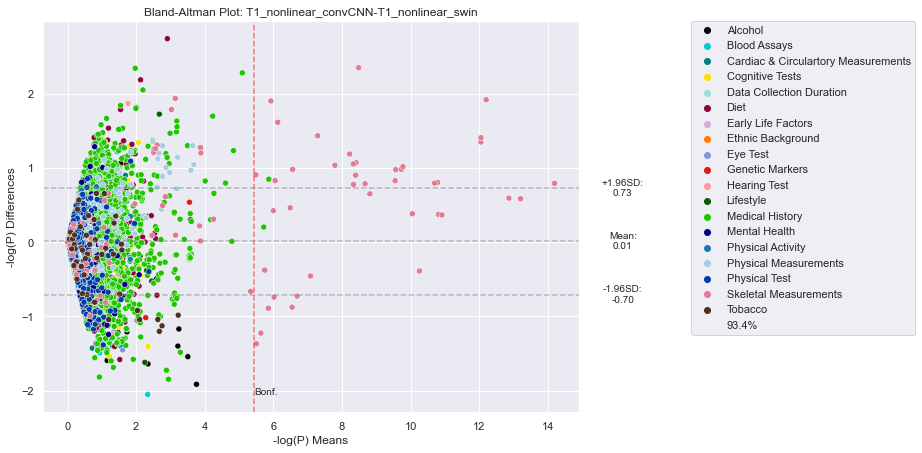

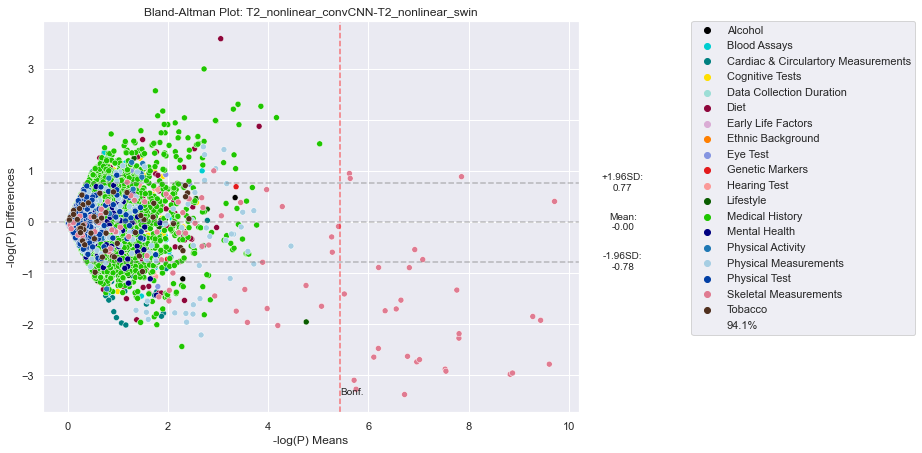

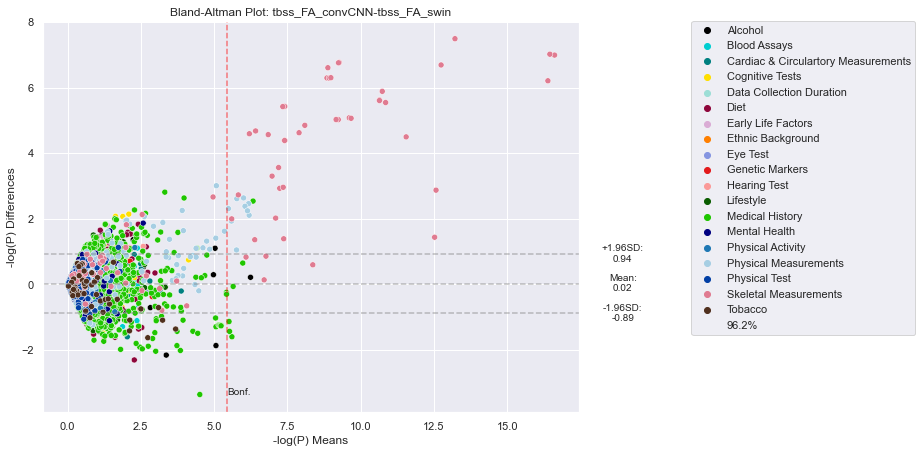

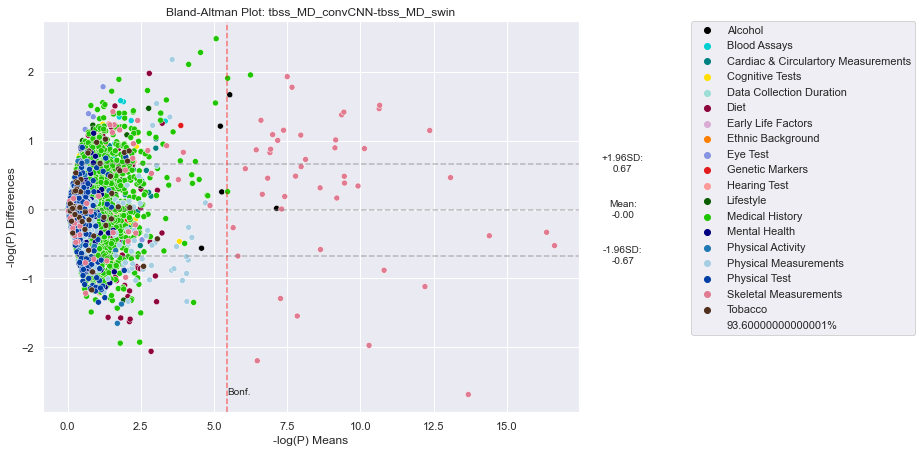

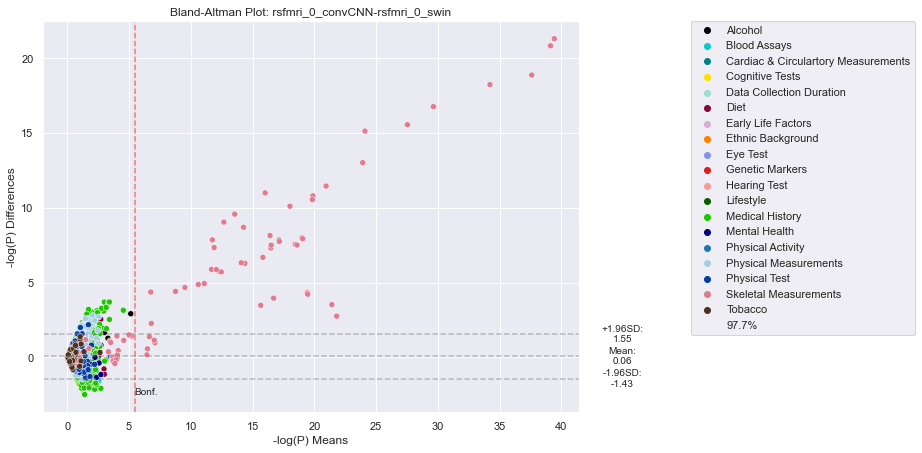

...

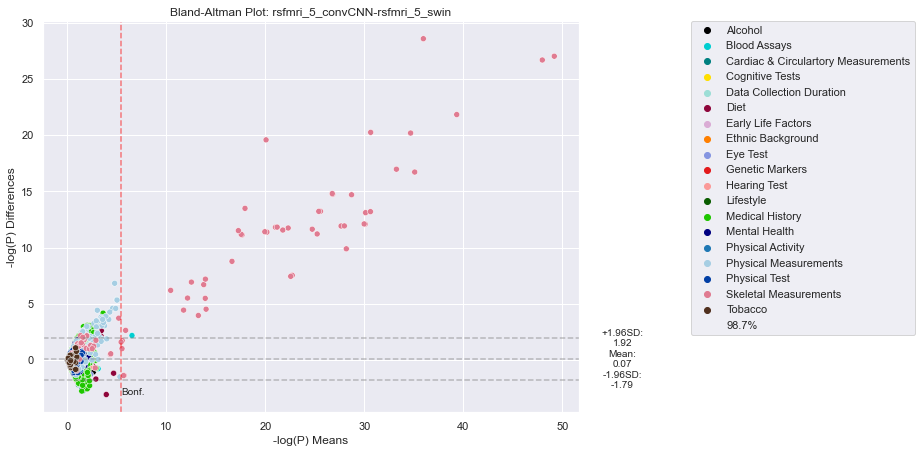

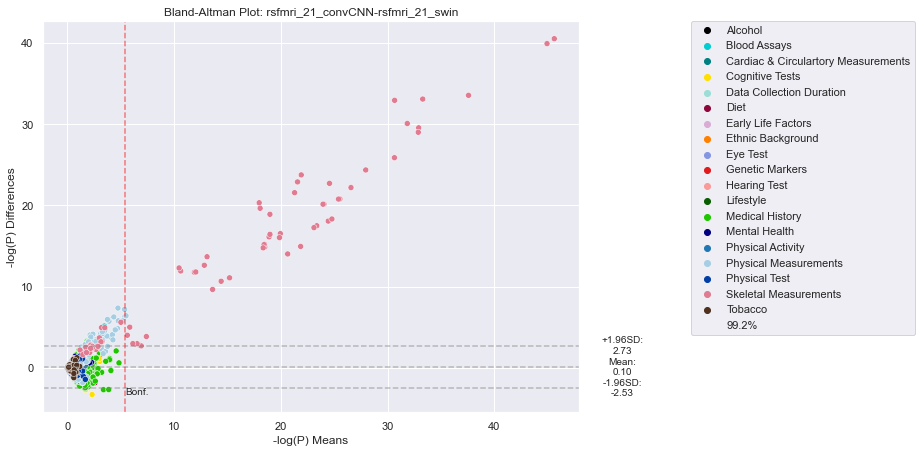

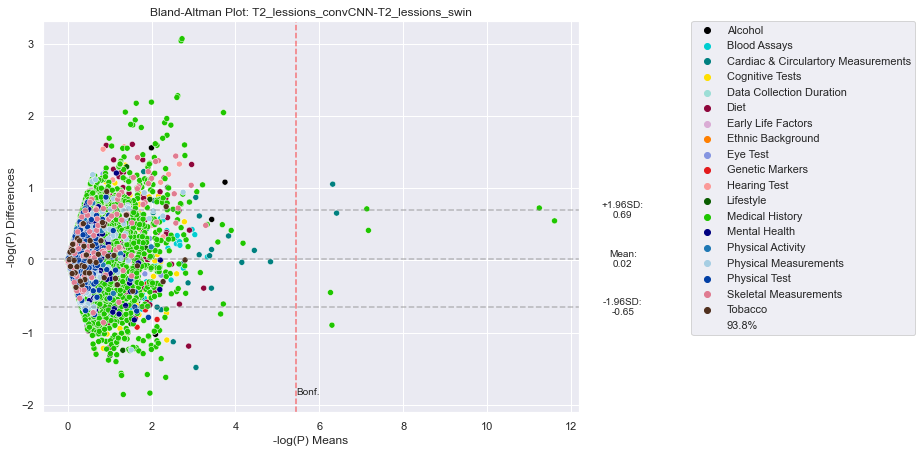

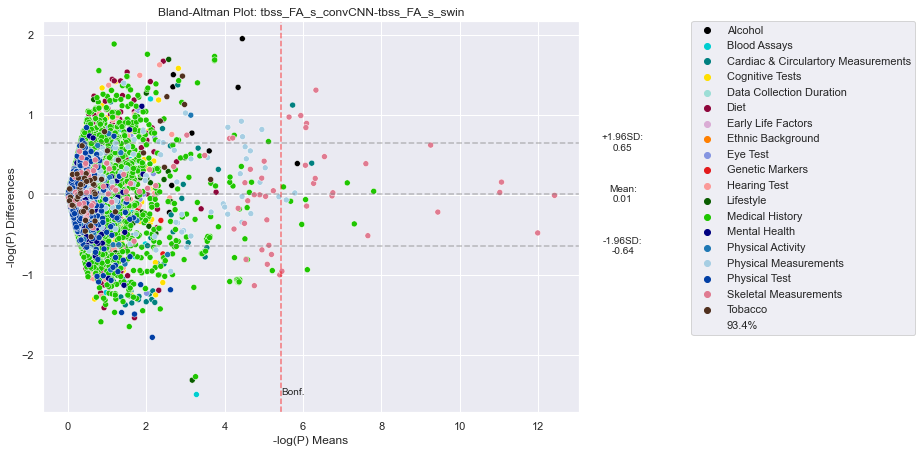

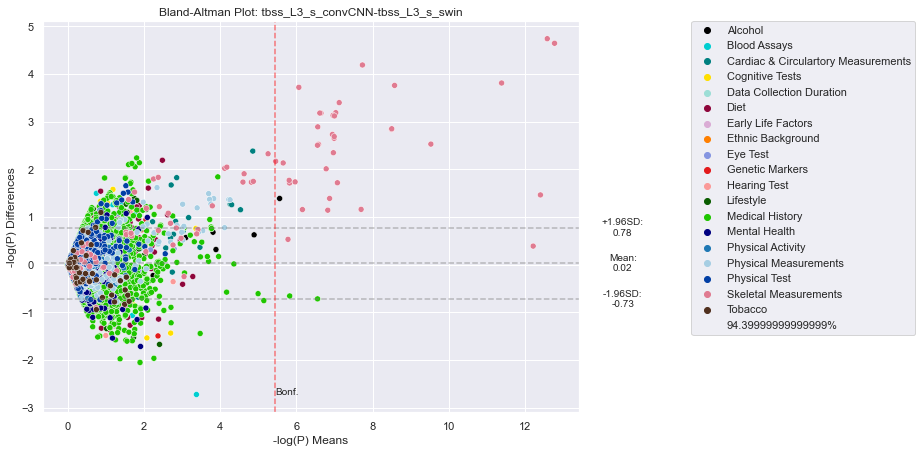

In [78]:

for idxNN in range(len(setNN)):
    dfNN = df3.iloc[idxNN].dataframe
    dfMM = df2.iloc[idxNN].dataframe
    modalityNN = df3.iloc[idxNN].modality
    modalityMM = df2.iloc[idxNN].modality
    modality = modalityNN+'_convCNN' + '-' + modalityMM+'_swin'
    dfm = pd.merge(dfNN, dfMM, on='idx', how='inner')
    bonf = df.iloc[idxNN].bonf
    bland_altman_plot(dfm.sort_values('Categories_x'), modality = modality, metric='-log(P)',
                     bonf=bonf, 
#                       heatmap=True
                     )

In [79]:
for idxNN in range(len(setNN)):
    dfNN = df3.iloc[idxNN].dataframe
    dfMM = df2.iloc[idxNN].dataframe
    modalityNN = df3.iloc[idxNN].modality
    modalityMM = df2.iloc[idxNN].modality
    modality = modalityNN+'_convCNN' + '-' + modalityMM+'_swin'
    dfm = pd.merge(dfNN, dfMM, on='idx', how='inner')
    
    pr = stats.pearsonr(dfm.log_p_values_x, dfm.log_p_values_y)
    print(modalityNN, pr[0])
    
#     if idxNN == 0:
#         break

T1_nonlinear 0.8628407857516552
T2_nonlinear 0.8063358178762006
tbss_FA 0.8528306559127048
tbss_MD 0.8964254657885955
rsfmri_0 0.8985814765010961
swi 0.9189409435698459
tfmri_1 0.916769752924517
tracts 0.8487226084566255
tbss_MO 0.911134954392922
tbss_ISOVF_s 0.8448212199582241
tbss_L2 0.8784872598512102
rsfmri_2 0.9637443160677823
rsfmri_10 0.8933910461867548
rsfmri_5 0.9285928203189331
rsfmri_21 0.8814377186223409
T2_lessions 0.8016160099212988
tbss_FA_s 0.881961394355065
tbss_L3_s 0.8360323918941337


In [41]:
df3

,modality,bonf,fdr,dataframe
0,T1_nonlinear,5.442009,3.722608,idx ...
1,T2_nonlinear,5.442009,3.643544,idx ...
2,tbss_FA,5.442009,3.258847,idx ...
3,tbss_MD,5.442009,3.452753,idx ...
4,rsfmri_0,5.442009,3.389271,idx ...
5,swi,5.442009,3.490886,idx ...
6,tfmri_1,5.442009,3.608196,idx ...
7,tracts,5.442009,3.403591,idx ...
8,tbss_MO,5.442009,3.494445,idx ...
9,tbss_ISOVF_s,5.442009,3.308815,idx ...


In [43]:
for idxNN in range(len(setNN)):
    dfNN = df3.iloc[idxNN].dataframe
    dfMM = df2.iloc[idxNN].dataframe
    modalityNN = df3.iloc[idxNN].modality
    modalityMM = df2.iloc[idxNN].modality
    modality = modalityNN+'_convCNN' + '-' + modalityMM+'_swin'
    dfm = pd.merge(dfNN, dfMM, on='idx', how='inner')
    
    FDR = df.iloc[idxDF].fdr
    dfm = dfm[dfm.log_p_values_x >= df3.iloc[idxDF].fdr]
    
    pr = stats.pearsonr(dfm.log_p_values_x, dfm.log_p_values_y)
    print(modalityNN, pr[0])
    
#     if idxNN == 0:
#         break

T1_nonlinear 0.9633950631691471
T2_nonlinear 0.8026601841236086
tbss_FA 0.809353388663405
tbss_MD 0.9506093026771284
rsfmri_0 0.9706213870831516
swi 0.9807000960191565
tfmri_1 0.9804791759197833
tracts 0.9383938726412971
tbss_MO 0.9811931039420192
tbss_ISOVF_s 0.8732527827385463
tbss_L2 0.9526587029821012
rsfmri_2 0.9891652865002984
rsfmri_10 0.9883251417619829
rsfmri_5 0.9787543585027452
rsfmri_21 0.9731255376980684
T2_lessions 0.8961517249760371
tbss_FA_s 0.9076504637527243
tbss_L3_s 0.9115798484341566


In [44]:
for idxNN in range(len(setNN)):
    dfNN = df3.iloc[idxNN].dataframe
    dfMM = df2.iloc[idxNN].dataframe
    modalityNN = df3.iloc[idxNN].modality
    modalityMM = df2.iloc[idxNN].modality
    modality = modalityNN+'_convCNN' + '-' + modalityMM+'_swin'
    dfm = pd.merge(dfNN, dfMM, on='idx', how='inner')
    
    FDR = df2.iloc[idxDF].fdr
    dfm = dfm[dfm.log_p_values_x >= df.iloc[idxDF].fdr]
    
    pr = stats.pearsonr(dfm.log_p_values_x, dfm.log_p_values_y)
    print(modalityNN, pr[0])
    
#     if idxNN == 0:
#         break

T1_nonlinear 0.9636645752308176
T2_nonlinear 0.80922711899551
tbss_FA 0.8107670138346067
tbss_MD 0.9510839371507852
rsfmri_0 0.9707683735313812
swi 0.9803506641205574
tfmri_1 0.9798697983229312
tracts 0.939071779093146
tbss_MO 0.9810635629295537
tbss_ISOVF_s 0.8748566339310663
tbss_L2 0.9532297899498763
rsfmri_2 0.9890622643076842
rsfmri_10 0.9885563353614981
rsfmri_5 0.9790649472768345
rsfmri_21 0.9733059582589794
T2_lessions 0.8970500852799423
tbss_FA_s 0.9084333820312076
tbss_L3_s 0.9141989504550823


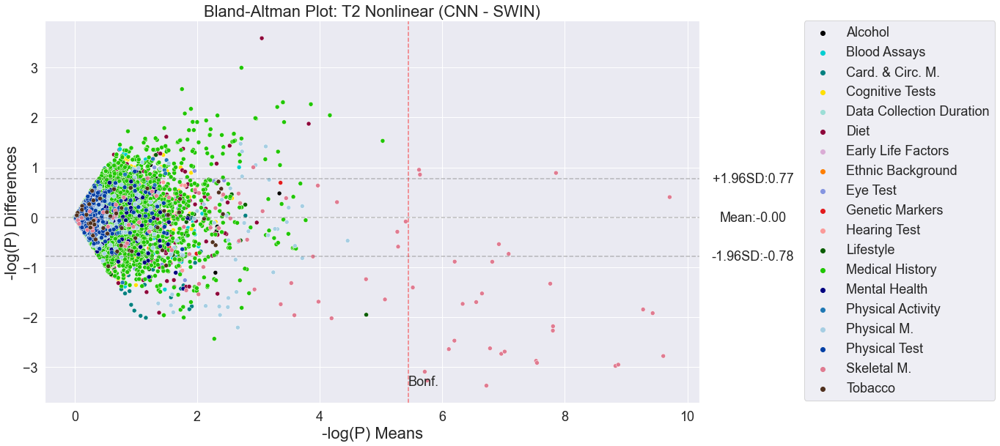

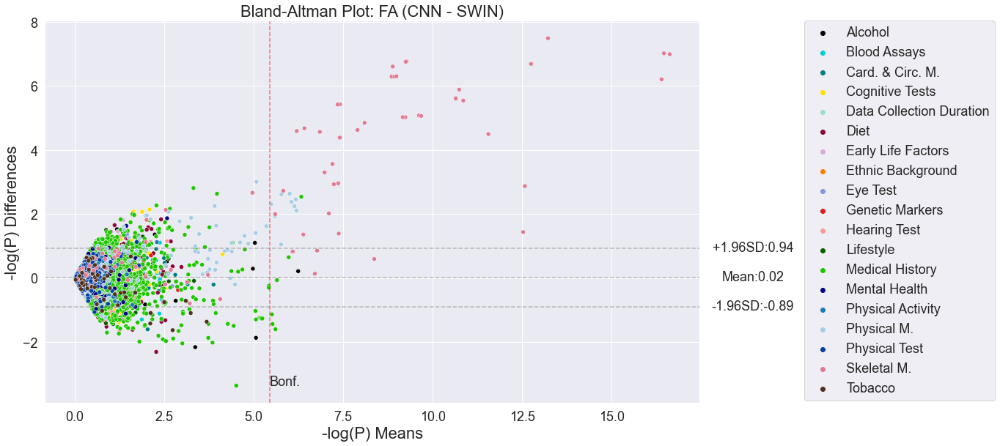

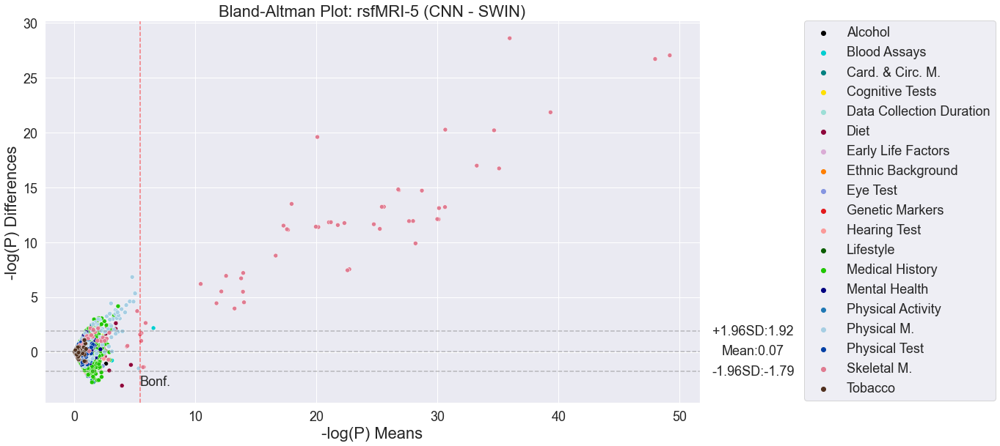

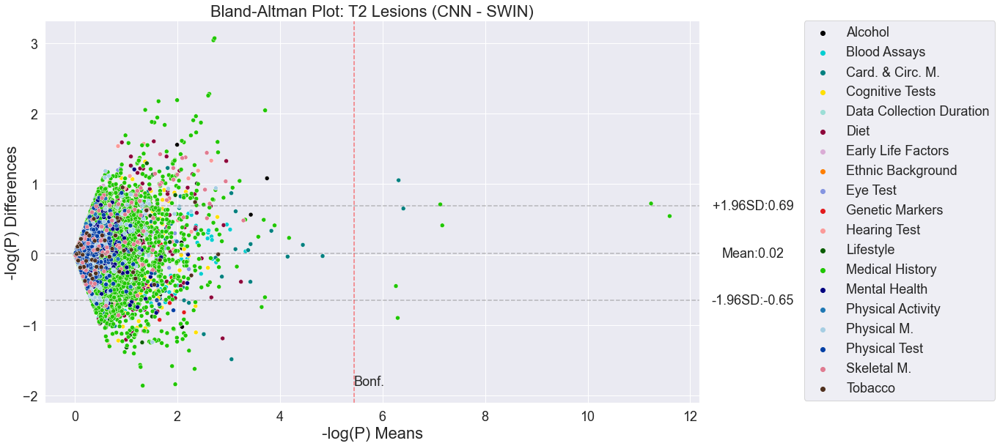

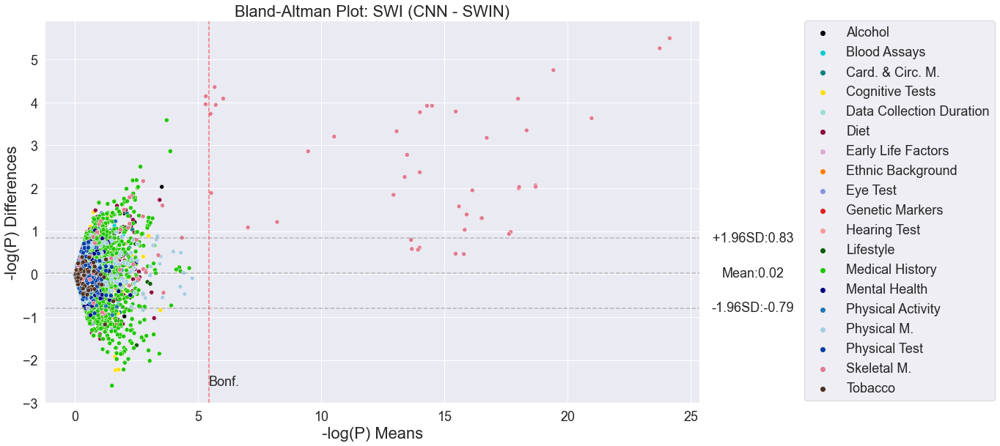

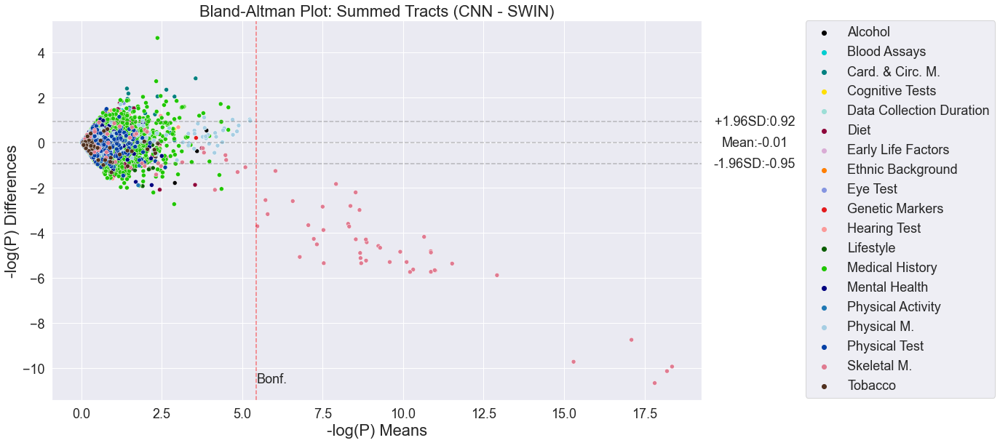

In [35]:
def bland_altman_plot_XTRA(df, modality, metric, heatmap=False, bonf=None, fdr=None):

    title_font_size=22
    ticks_font_size=18
    legend_font = 18
    figsize=(16, 9.6)
    
    if metric == '-log(P)':
        colData1 = 'log_p_values_x'
        colData2 = 'log_p_values_y'
    elif metric == 'Pearson R':
        colData1 = 'pearson_r_x'
        colData2 = 'pearson_r_y'
    elif metric == 'Pearson R Abs':
        colData1 = 'abs_pearson_r_x'
        colData2 = 'abs_pearson_r_y'
    else:
        return
    data1     = df[colData1].to_numpy()
    data2     = df[colData2].to_numpy()
    mean      = np.mean([data1, data2], axis=0)
    diff      = data1 - data2                   # Difference between data1 and data2
    md        = np.mean(diff)                   # Mean of the difference
    sd        = np.std(diff, axis=0)            # Standard deviation of the difference
    CI_low    = md - 1.96*sd
    CI_high   = md + 1.96*sd
    CI_perc = len(np.where((diff>=CI_low) & (diff <= CI_high))[0]) / len(diff)
    CI_perc = round(CI_perc, 3) * 100

    plt.figure(figsize=figsize, facecolor='white')
    
    if heatmap == False:
        colorCycle=['#000000', '#00CED1','#008080','#ffdf00','#9cded6','#8e063b','#DAACD5','#ff7f00','#8595e1','#e31a1c','#fb9a99','#0a5d00','#1fc600','#000080','#1f78b4','#a6cee3', '#023fa5', '#e07b91', '#50301e']
        sns.scatterplot(data=df, x=mean, y=diff, hue='Categories_x', palette=colorCycle)
    else:
        sns.set_style("darkgrid", {'image.cmap': u'plasma'})
        x = mean
        y = diff
        xy = np.vstack((x,y))
        z = gaussian_kde(xy)
        z = z.evaluate(xy)

        idx = z.argsort()
        x, y, z = x[idx], y[idx], z[idx]
        plt.scatter(x,y,c=z)
        
    plt.axhline(md,           color='gray', linestyle='--', alpha=0.5)
    plt.axhline(md + 1.96*sd, color='gray', linestyle='--', alpha=0.5)
    plt.axhline(md - 1.96*sd, color='gray', linestyle='--', alpha=0.5)

    if bonf is not None:
        plt.axvline(bonf, color='red', linestyle='--', alpha=0.5)
        plt.text(x=bonf, y=min(diff), s='Bonf.', fontsize=ticks_font_size)
    if fdr is not None:
        plt.axvline(fdr, color='red', linestyle='--', alpha=0.5)
        plt.text(x=fdr, y=min(diff), s='FDR.', fontsize=ticks_font_size)
    
    xOutPlot = np.min(mean) + (np.max(mean)-np.min(mean))*1.14
    
    plt.text(xOutPlot, md - 1.96*sd, 
#         r'-1.96SD:' + "\n" + "%.2f" % CI_low, 
        r'-1.96SD:' + "%.2f" % CI_low, 
        ha = "center",
        va = "center",
             fontsize=ticks_font_size
        )
    plt.text(xOutPlot, md + 1.96*sd, 
#         r'+1.96SD:' + "\n" + "%.2f" % CI_high,
             r'+1.96SD:' + "%.2f" % CI_high,
        ha = "center",
        va = "center",
             fontsize=ticks_font_size
        )
    plt.text(xOutPlot, md, 
#         r'Mean:' + "\n" + "%.2f" % md, 
             r'Mean:' + "%.2f" % md, 
        ha = "center",
        va = "center",
               fontsize=ticks_font_size
        )
    
    title = 'Bland-Altman Plot: ' + modality
    xlabel = metric + ' Means'
    ylabel = metric + ' Differences'
    
    plt.xlabel(xlabel, fontsize=title_font_size)
    plt.ylabel(ylabel, fontsize=title_font_size)
    plt.title(title, fontsize=title_font_size)
    
    plt.tick_params(axis='both', labelsize=ticks_font_size)
    
    if heatmap==False:
#         plt.plot([],[],' ',label= 'Correlations = ' + str(CI_perc) + '%')
        plt.legend(bbox_to_anchor=(1.16, 1), loc=2, borderaxespad=0., fontsize=legend_font)
    
    plt.savefig(modality, bbox_inches='tight', facecolor='white')

setNN = [
    'T2_nonlinear',           #2
    'tbss_FA',                #3
    'rsfmri_5',               #12
    'T2_lessions',                #7
    'swi',
    'tracts',                 #8
]

setNames = titles = [
    'T2 Nonlinear', 'FA', 'rsfMRI-5', 'T2 Lesions', 'SWI', 'Summed Tracts'

]

df  = pd.read_pickle('../../multi-age-mapper/Analysis Female - Variance Study/female_vars_testB_convergence9.pkl')
df2 = pd.read_pickle('female_vars_testB_convergence9.pkl')

for idxNN in range(len(setNN)):
    idxDF = np.where(setNN[idxNN] == df.modality.to_numpy())[0][0]
    idxNNname = np.where(setNN[idxNN] == df2.modality.to_numpy())[0][0]
    dfNN = df.iloc[idxDF].dataframe
    dfMM = df2.iloc[idxNNname].dataframe
    modalityNN = df.iloc[idxDF].modality
    modalityMM = df2.iloc[idxNNname].modality
    modality = setNames[idxNN] + ' (CNN - SWIN)'
    dfm = pd.merge(dfNN, dfMM, on='idx', how='inner')
    bonf = df.iloc[idxDF].bonf
    
    dfm.loc[dfm['Categories_x'] == 'Cardiac & Circulartory Measurements', 'Categories_x'] = 'Card. & Circ. M.'
    dfm.loc[dfm['Categories_x'] == 'Physical Measurements', 'Categories_x'] = 'Physical M.'
    dfm.loc[dfm['Categories_x'] == 'Skeletal Measurements', 'Categories_x'] = 'Skeletal M.'

    dfm.loc[dfm['Categories_y'] == 'Cardiac & Circulartory Measurements', 'Categories_y'] = 'Card. & Circ. M.'
    dfm.loc[dfm['Categories_y'] == 'Physical Measurements', 'Categories_y'] = 'Physical M.'
    dfm.loc[dfm['Categories_y'] == 'Skeletal Measurements', 'Categories_y'] = 'Skeletal M.'
    
    bland_altman_plot_XTRA(dfm.sort_values('Categories_x'), modality = modality, metric='-log(P)',
                     bonf=bonf, 
                     )